# Project Setup

## Import Libraries

## Import Custom Cleaning Modules

In [69]:
# Core
import pandas as pd
import numpy as np

# Config
from src.config import GLOBAL_CONFIG

# Cleaning
from src.cleaning_pipeline import clean_full_dataset

# Regime splitting
from src.regime_split import (
    filter_by_conditions,
    split_by_regime,
    summarize_regimes
)

# Target filtering
from src.target_filtering import drop_missing_target

# EDA
from src.eda import (
    inspect_regime,
    run_full_eda,
    list_sorted_correlations,
    target_summary
)

# Modeling
from src.modeling import (
    run_full_regime_analysis,
    run_median_baseline,
    run_ridge,
    run_rf,
    run_xgb
)

# Metrics
from src.metrics import (
    rmse,
    mae,
    r2,
    error_analysis,
    bootstrap_rmse_ci
)

# Feature engineering
from src.feature_engineering import (
    prepare_data,
    build_preprocessor
)

# Column type detection
from src.transforms import detect_col_types

# Feature importance
from src.feature_importance import (
    ridge_coefficients,
    rf_gini_importance,
    xgb_importance
)

# Plotting
from src.plotting import (
    plot_error_distribution,
    plot_per_fold_rmse,
    plot_predicted_vs_actual
)

# Utilities
from src.utils import safe_filename

# shap
from src.shap_analysis import (
    # Core SHAP
    build_shared_shap_background,
    shap_linear,
    shap_tree,
    plot_shap_summary,
    get_best_model_for_regime,
    run_shap_for_best_model,
    run_shap_all_regimes,

    # Balanced SHAP
    get_common_features,
    restrict_preprocessor,
    run_balanced_shap_for_best_model,
    top_features_to_rank_dict,
    build_rank_df_from_balanced_outputs,
    across_spearman_mean,
    rank_variance,
    across_regime_spearman,
    across_regime_rank_variance,

    # Extra SHAP utilities (you said these exist)
    replot_shap_with_readable_names,
    sanitize_filename,
    rename_top_features,

    # Subgroup SHAP
    create_subgroups,
    compute_shap_values_safe,
    rank_top_features,
    shap_subgroup_analysis,
    run_shap_subgroups_for_regime,
    subgroup_shap_to_rank_dict,
    spearman_between_rank_dicts,
    spearman_within_regime,
    compare_subgroups_within_regime,
    spearman_across_regimes,
    compare_subgroup_across_regimes,
    compute_all_subgroup_spearman,
    table_all_subgroups_across_regimes
)



## Define File Paths and Dataset Mapping

In [10]:
# Define file paths and dataset mapping
folder_path = (
    "C:/Users/shari/OneDrive/MSc Data Science and Society/Thesis_DSS_2026/data"
)

file_year_map = {
    2008: "cw08a_EN_1.1p.dta",
    2009: "cw09b_EN_3.0p.dta",
    2010: "cw10c_EN_1.0p.dta",
    2011: "cw11d_EN_1.0p.dta",
    2012: "cw12e_EN_1.0p.dta",
    2013: "cw13f_EN_1.0p.dta",
    2014: "cw14g_EN_1.0p.dta",
    2015: "cw15h_EN_2.0p.dta",
    2016: "cw16i_EN_2.0p.dta",
    2017: "cw17j_EN_2.0p.dta",
    2018: "cw18k_EN_2.0p.dta",
    2019: "cw19l_EN_3.0p.dta",
    2020: "cw20m_EN_1.0p.dta",
    2021: "cw21n_EN_1.0p.dta",
    2022: "cw22o_EN_1.0p.dta",
    2023: "cw23p_EN_1.0p.dta",
    2024: "cw24q_EN_1.0p.dta"
}

# Load Raw LISS Datasets

In [12]:
# Load datasets into a dictionary
datasets = load_liss_datasets(folder_path, file_year_map)
print(f"Loaded {len(datasets)} datasets.")

Loaded 17 datasets.


In [16]:

cleaned = {}

# Apply preprocess_dataset() to each year
for year, df in datasets.items():
    cleaned[year] = process_dataset(df, year)

# merge all years into a single dataframe
merged_df = merge_datasets(cleaned)

# initial summary of merged dataset
print("Final merged_df shape:", merged_df.shape)
print(merged_df["year"].value_counts().sort_index())


Final merged_df shape: (99411, 610)
year
2008    6951
2009    5701
2010    6366
2011    5358
2012    6013
2013    5585
2014    6570
2015    6237
2016    5832
2017    5926
2018    5832
2019    5210
2020    5646
2021    5478
2022    5775
2023    5139
2024    5792
Name: count, dtype: Int64


# Column-Level Cleaning

In [91]:
df_clean = merged_df.copy()

# Drop predefined columns
cols_to_remove_step1 = [
    '_encr', 'se_encr', '_m',
    '000', '001','505', '504', '503', '502', '501',
    '500', '499', '498', '497', '496', '001', '121',
    '145', '525', '101'
]
df_clean, removed_step1 = drop_columns(df_clean, cols_to_remove_step1)

# Drop fully empty columns
df_clean, removed_step2 = drop_empty_columns(df_clean)

# Drop pension, exit, and text columns
df_clean, removed_step3 = drop_pension_exit_and_text_columns(df_clean)

# Drop contract hours and income variables
df_clean, removed_step4 = drop_contract_hours_and_income(df_clean)

# Normalize all other text columns
df_clean = normalize_all_text(df_clean)


In [28]:
print("Final cleaned shape:", df_clean.shape)
print("Remaining columns:", df_clean.shape[1])


Final cleaned shape: (99411, 410)
Remaining columns: 410


In [45]:
# identify all columns that are object/string type
cat_cols = merged_df.select_dtypes(include=['object']).columns

# list the unique values for each categorical column
for col in cat_cols:
    print(f"\nColumn: {col}")
    print(merged_df[col].unique())



Column: 000
['no, does not work' 'yes, does work' nan 'no' 'yes' 'No' 'Yes']

Column: 001
['yes' 'no' nan 'No' 'Yes']

Column: 004
['8' '5' '9' '7' '6' '4' '1' 'not at all satisfied' 'fully satisfied' '2'
 '3' '10 = fully satisfied' '0 = not at all satisfied' nan]

Column: 005
['primary school'
 'HAVO (higher general secondary education; US: junior high school)'
 'academic education (including technical and economic colleges, former style) mas'
 'LBO (lower professional education)' 'conservatory and art academy'
 'KMBO (short intermediate professional education), VHBO (preparatory higher profe'
 'MBO professional training program (intermediate professional education)'
 'VGLO (continued lower education)'
 'lower technical school, household school'
 'HBO (higher professional education), institutes of higher education, new style'
 'MULO, ULO, MAVO (lower/intermediate secondary education; US: junior high school)'
 'academic education, master'
 'academic education (including technical and 

### Further clenaing

In [25]:
df_clean = clean_full_dataset(merged_df).copy()


Final cleaned dataset shape: (99411, 410)
Total columns: 410


In [ ]:
df_clean.info()
df_clean.head()


### Regime Filtering + Splitting

In [27]:
# Filter to only working individuals 
filtered_df = filter_by_conditions(df_clean)
print("Original shape:", df_clean.shape)
print("Filtered shape:", filtered_df.shape)


Original df_cleaned shape: (99411, 410)
Filtered df shape: (57534, 410)
Regime A years: [2008.0, 2009.0, 2010.0, 2011.0, 2012.0, 2013.0], shape: (22056, 410)
Regime B years: [2014.0, 2015.0, 2016.0, 2017.0, 2018.0, 2019.0], shape: (20118, 410)
Regime C years: [2020.0, 2021.0, 2022.0, 2023.0, 2024.0], shape: (15360, 410)


In [ ]:
# SPlit into the 3 regimes
regimes = split_by_regime(filtered_df)

# Inspect the regimes
summarize_regimes(regimes)

# to access each regime
df_regime_a = regimes["A"]
df_regime_b = regimes["B"]
df_regime_c = regimes["C"]


## Target Filtering (Empty Rows)

In [29]:
regimes = drop_missing_target_for_regimes(regimes, target="127")


# Exploratory Data Analysis (EDA)

In [33]:
eda_a = inspect_regime(df_regime_a, "Regime A")
eda_b = inspect_regime(df_regime_b, "Regime B")
eda_c = inspect_regime(df_regime_c, "Regime C")


===== Regime A Shape =====
(22007, 410)

===== Regime A Column Types =====
002    float64
003    float64
004    float64
005     object
006     object
        ...   
609    float64
610    float64
611     object
612    float64
613    float64
Length: 410, dtype: object

===== Regime A Missingness Percent =====
613    100.0
531    100.0
553    100.0
552    100.0
551    100.0
       ...  
093      0.0
094      0.0
095      0.0
096      0.0
002      0.0
Length: 410, dtype: float64

===== Regime A Descriptive Statistics Numeric =====
                002           003           004           011           012  \
count  22007.000000  18300.000000  22007.000000  21893.000000  21893.000000   
mean    1967.532694     42.113607      7.258463      0.159823      0.081533   
std       12.942890     12.957304      1.642720      0.366450      0.273658   
min     1921.000000     15.000000      0.000000      0.000000      0.000000   
25%     1957.000000     32.000000      7.000000      0.000000      0.00

In [ ]:
eda_a_full = run_full_eda(df_regime_a, "Regime A")
eda_b_full = run_full_eda(df_regime_b, "Regime B")
eda_c_full = run_full_eda(df_regime_c, "Regime C")


In [ ]:
# Correlation Pairs
corr_pairs_a = list_sorted_correlations(eda_a_full["correlation"], min_abs_corr=0.3)


In [ ]:
# Target Summary
target_summary(df_regime_a, "127", "Regime A (2008–2013)")
target_summary(df_regime_b, "127", "Regime B (2014–2019)")
target_summary(df_regime_c, "127", "Regime C (2020–2024)")

# Modelling + Evaluation


RUNNING FULL EXPERIMENT – Regime A
Dropped (high missing): ['006', '009', '044', '045', '049', '052', '055', '056', '057', '059', '060', '061', '062', '063', '064', '066', '067', '069', '070', '072', '073', '074', '076', '077', '078', '079', '080', '081', '083', '084', '086', '087', '103', '104', '105', '106', '107', '108', '109', '110', '111', '113', '114', '115', '116', '117', '118', '119', '120', '124', '125', '135', '508', '137', '144', '288', '289', '308', '309', '310', '311', '312', '314', '315', '316', '318', '319', '320', '321', '322', '323', '324', '325', '326', '327', '328', '329', '330', '331', '332', '333', '334', '335', '336', '337', '338', '339', '340', '341', '342', '343', '344', '345', '346', '347', '348', '349', '350', '351', '352', '353', '354', '355', '356', '357', '358', '359', '360', '361', '362', '363', '364', '365', '366', '367', '368', '369', '370', '371', '372', '373', '374', '375', '376', '377', '378', '379', '380', '381', '386', '387', '388', '389', '408', '

C:\Users\shari\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:317: UserWarning: The total space of parameters 3 is smaller than n_iter=8. Running 3 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Dropped (high missing): ['006', '009', '044', '045', '049', '052', '055', '056', '057', '059', '060', '061', '062', '063', '064', '066', '067', '069', '070', '072', '073', '074', '076', '077', '078', '079', '080', '081', '083', '084', '086', '087', '103', '104', '105', '106', '107', '108', '109', '110', '111', '113', '114', '115', '116', '117', '118', '119', '120', '124', '125', '135', '508', '137', '144', '288', '289', '308', '309', '310', '311', '312', '314', '315', '316', '318', '319', '320', '321', '322', '323', '324', '325', '326', '327', '328', '329', '330', '331', '332', '333', '334', '335', '336', '337', '338', '339', '340', '341', '342', '343', '344', '345', '346', '347', '348', '349', '350', '351', '352', '353', '354', '355', '356', '357', '358', '359', '360', '361', '362', '363', '364', '365', '366', '367', '368', '369', '370', '371', '372', '373', '374', '375', '376', '377', '378', '379', '380', '381', '386', '387', '388', '389', '408', '410', '440', '441', '442', '443', '4

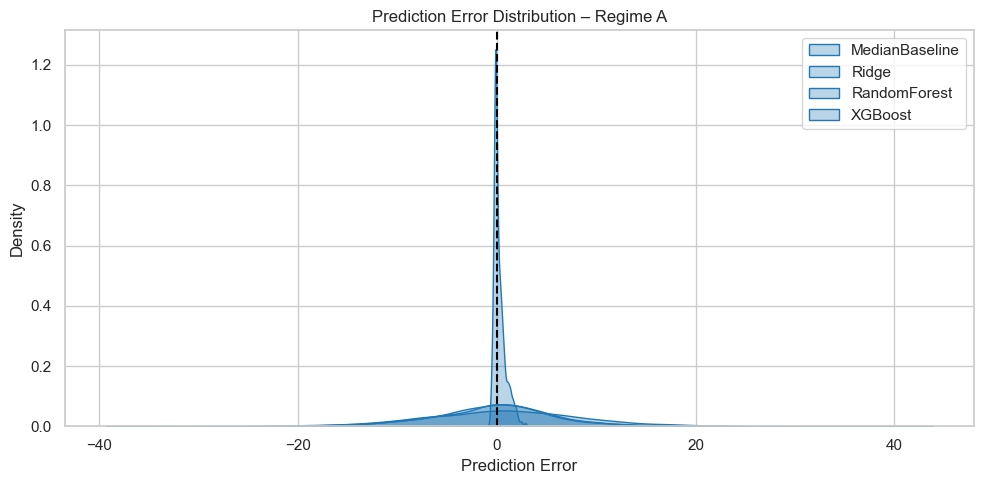

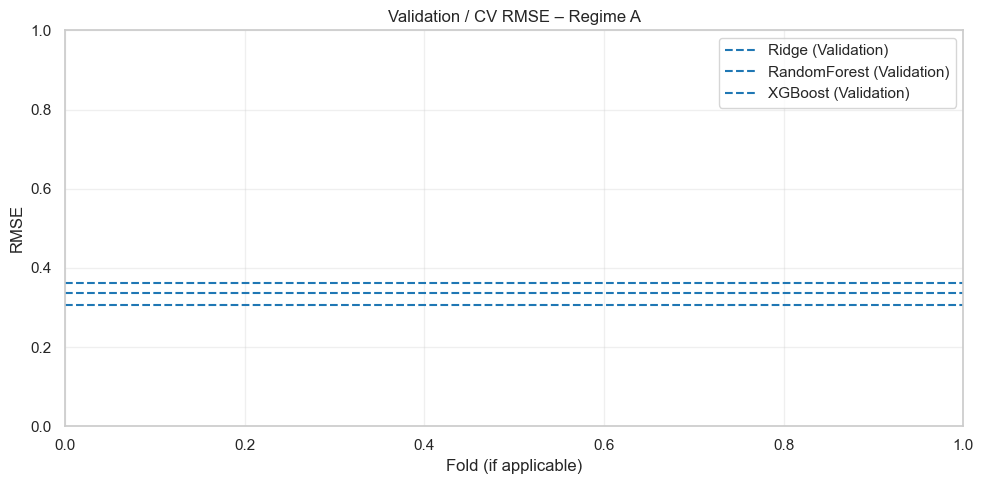

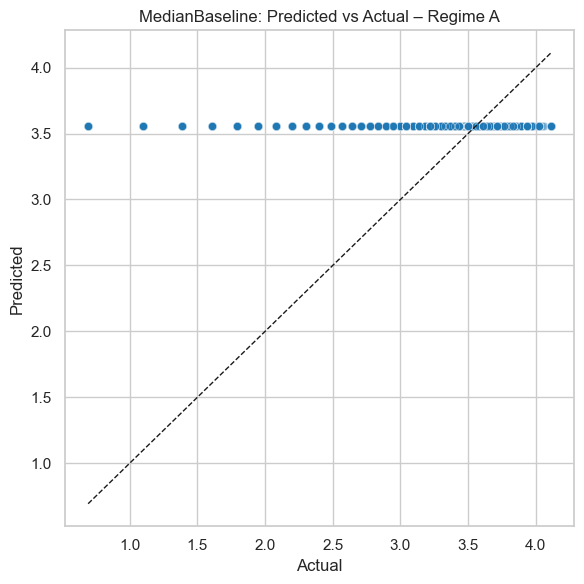

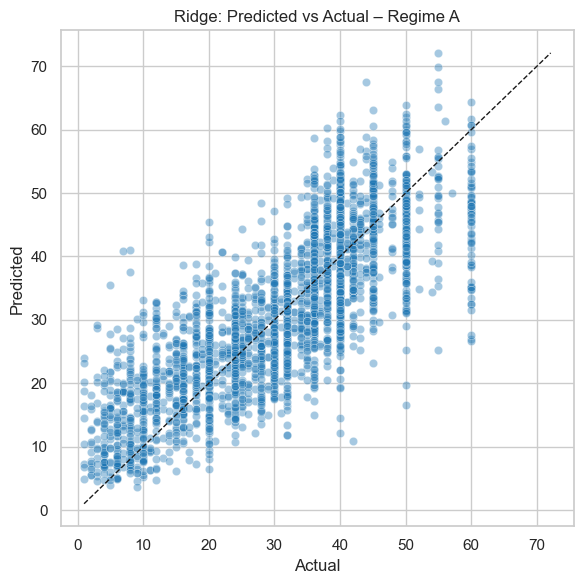

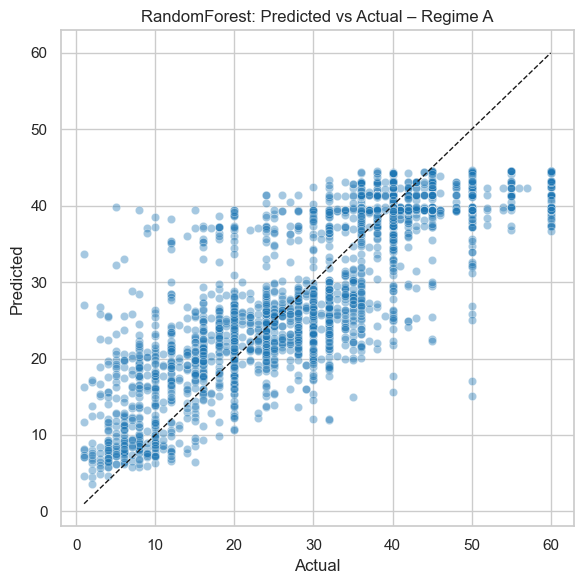

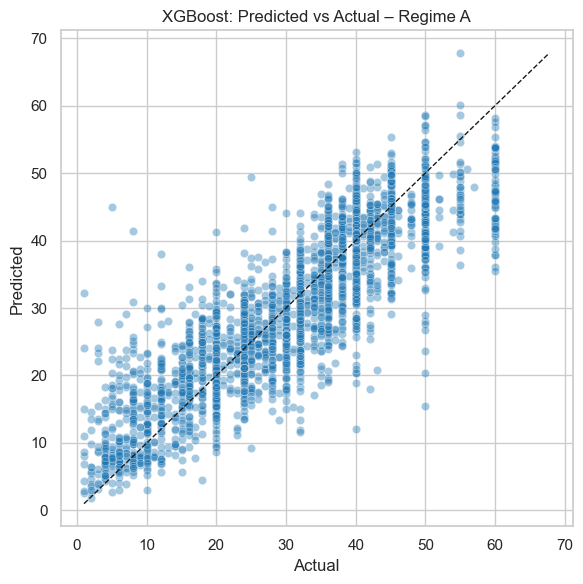


RUNNING FULL EXPERIMENT – Regime B
Dropped (high missing): ['006', '009', '036', '038', '039', '040', '042', '043', '044', '045', '046', '047', '049', '050', '052', '053', '055', '056', '057', '059', '060', '061', '062', '063', '064', '066', '067', '069', '070', '072', '073', '074', '076', '077', '078', '079', '080', '081', '083', '084', '086', '087', '103', '104', '105', '106', '107', '108', '109', '110', '111', '113', '114', '115', '116', '117', '118', '119', '120', '124', '125', '135', '508', '137', '144', '288', '289', '308', '309', '310', '311', '312', '314', '315', '316', '318', '319', '320', '321', '322', '323', '324', '325', '326', '327', '328', '329', '330', '331', '332', '333', '334', '335', '336', '337', '338', '339', '340', '341', '342', '343', '344', '345', '346', '347', '348', '349', '350', '351', '352', '353', '354', '355', '356', '357', '358', '359', '360', '361', '362', '363', '364', '365', '366', '367', '368', '369', '370', '371', '372', '373', '374', '375', '376', '

C:\Users\shari\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:317: UserWarning: The total space of parameters 3 is smaller than n_iter=8. Running 3 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Dropped (high missing): ['006', '009', '036', '038', '039', '040', '042', '043', '044', '045', '046', '047', '049', '050', '052', '053', '055', '056', '057', '059', '060', '061', '062', '063', '064', '066', '067', '069', '070', '072', '073', '074', '076', '077', '078', '079', '080', '081', '083', '084', '086', '087', '103', '104', '105', '106', '107', '108', '109', '110', '111', '113', '114', '115', '116', '117', '118', '119', '120', '124', '125', '135', '508', '137', '144', '288', '289', '308', '309', '310', '311', '312', '314', '315', '316', '318', '319', '320', '321', '322', '323', '324', '325', '326', '327', '328', '329', '330', '331', '332', '333', '334', '335', '336', '337', '338', '339', '340', '341', '342', '343', '344', '345', '346', '347', '348', '349', '350', '351', '352', '353', '354', '355', '356', '357', '358', '359', '360', '361', '362', '363', '364', '365', '366', '367', '368', '369', '370', '371', '372', '373', '374', '375', '376', '377', '378', '379', '380', '381', '3

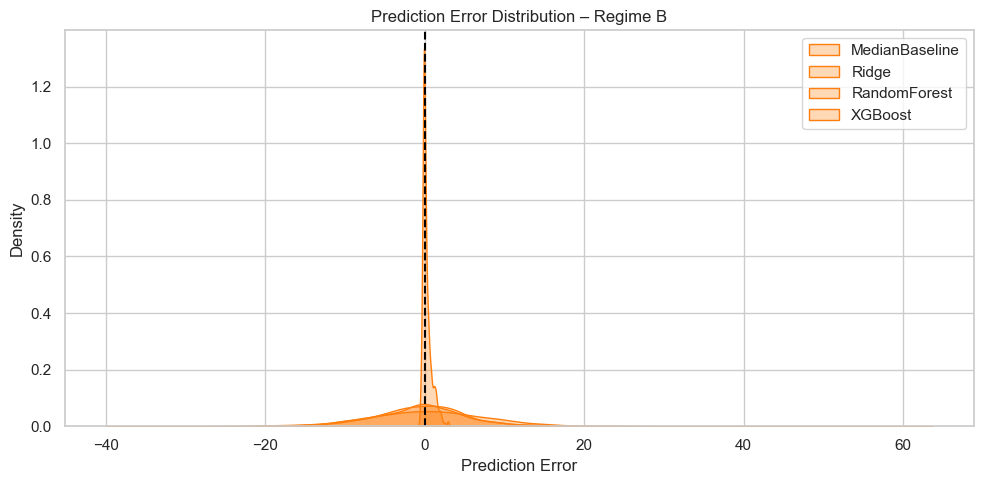

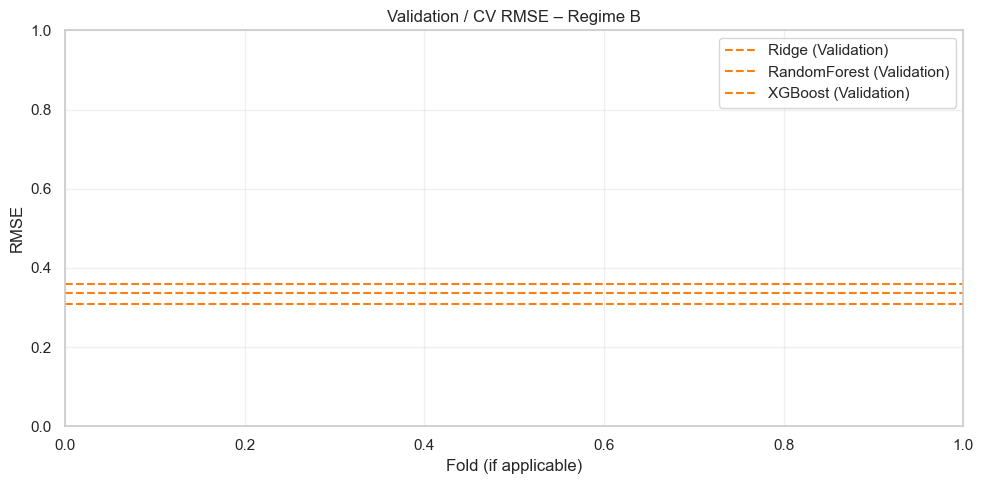

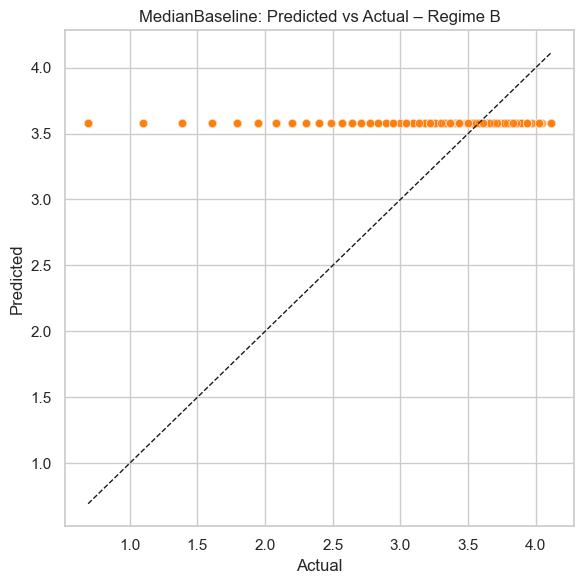

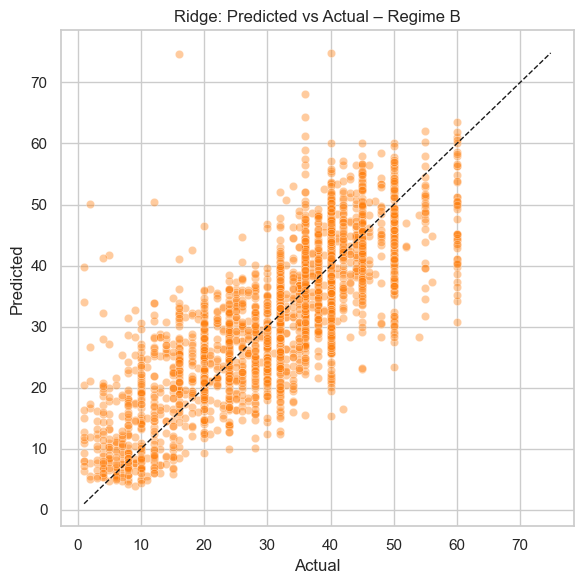

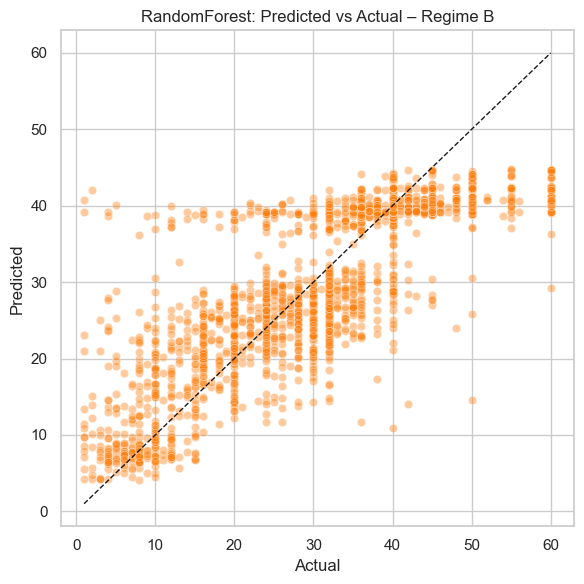

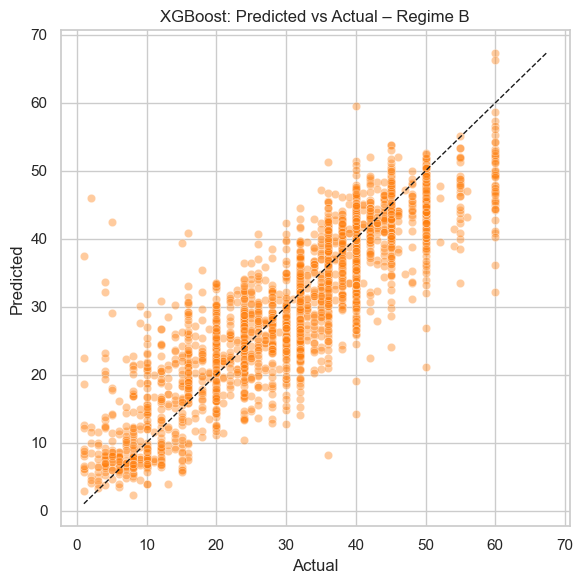


RUNNING FULL EXPERIMENT – Regime C
Dropped (high missing): ['004', '006', '009', '028', '030', '032', '033', '034', '036', '038', '039', '040', '042', '043', '044', '045', '046', '047', '049', '050', '051', '052', '053', '055', '056', '057', '059', '060', '061', '062', '063', '064', '066', '067', '068', '069', '070', '072', '073', '074', '075', '076', '077', '078', '079', '080', '081', '083', '084', '086', '087', '103', '104', '105', '106', '107', '108', '109', '110', '111', '113', '114', '115', '116', '117', '118', '119', '120', '124', '125', '132', '135', '508', '137', '144', '288', '289', '311', '312', '314', '315', '316', '318', '319', '320', '321', '322', '323', '324', '325', '326', '327', '328', '329', '330', '331', '332', '333', '334', '335', '336', '337', '338', '339', '340', '341', '342', '343', '344', '345', '346', '347', '348', '349', '350', '351', '352', '353', '354', '355', '356', '357', '358', '359', '360', '361', '362', '363', '364', '365', '366', '367', '368', '369', '

C:\Users\shari\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:317: UserWarning: The total space of parameters 3 is smaller than n_iter=8. Running 3 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Dropped (high missing): ['004', '006', '009', '028', '030', '032', '033', '034', '036', '038', '039', '040', '042', '043', '044', '045', '046', '047', '049', '050', '051', '052', '053', '055', '056', '057', '059', '060', '061', '062', '063', '064', '066', '067', '068', '069', '070', '072', '073', '074', '075', '076', '077', '078', '079', '080', '081', '083', '084', '086', '087', '103', '104', '105', '106', '107', '108', '109', '110', '111', '113', '114', '115', '116', '117', '118', '119', '120', '124', '125', '132', '135', '508', '137', '144', '288', '289', '311', '312', '314', '315', '316', '318', '319', '320', '321', '322', '323', '324', '325', '326', '327', '328', '329', '330', '331', '332', '333', '334', '335', '336', '337', '338', '339', '340', '341', '342', '343', '344', '345', '346', '347', '348', '349', '350', '351', '352', '353', '354', '355', '356', '357', '358', '359', '360', '361', '362', '363', '364', '365', '366', '367', '368', '369', '370', '371', '372', '373', '374', '3

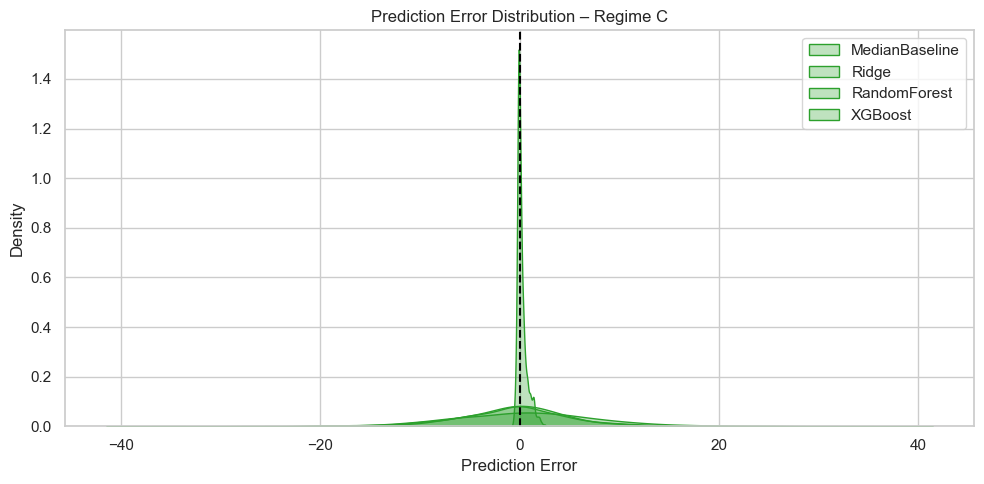

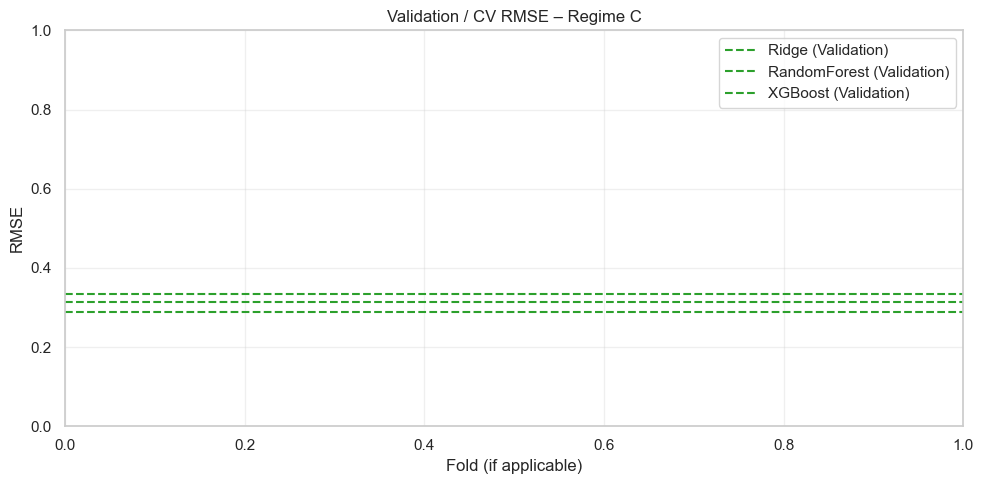

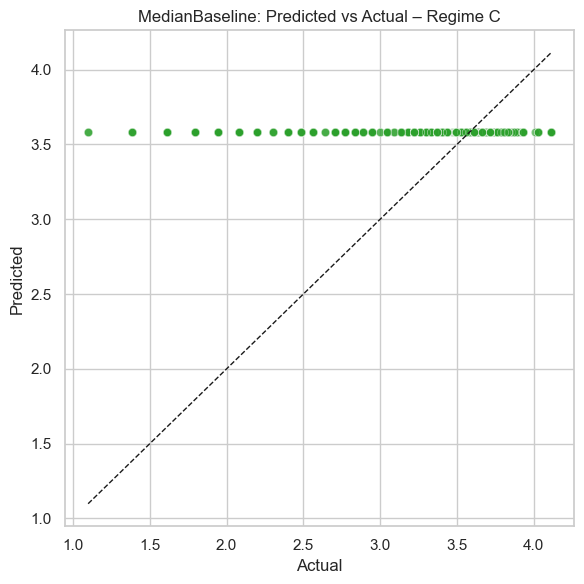

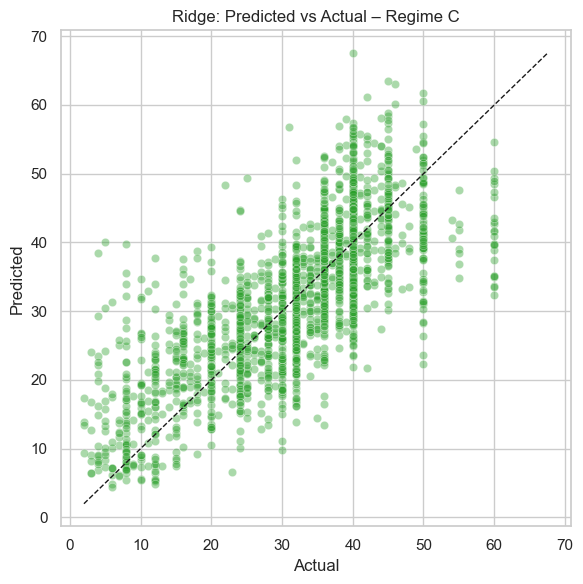

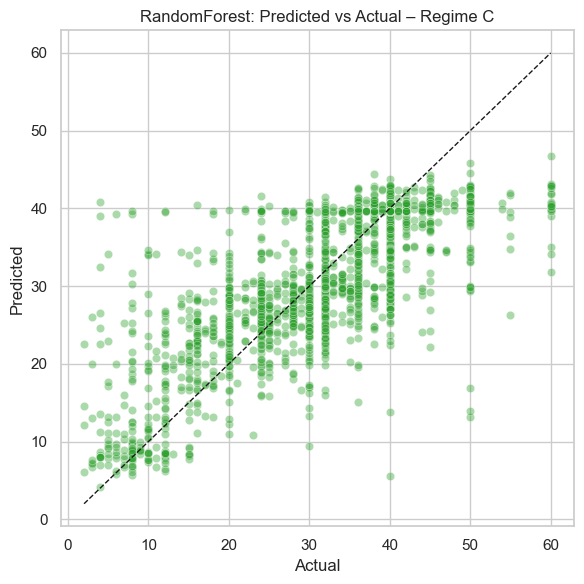

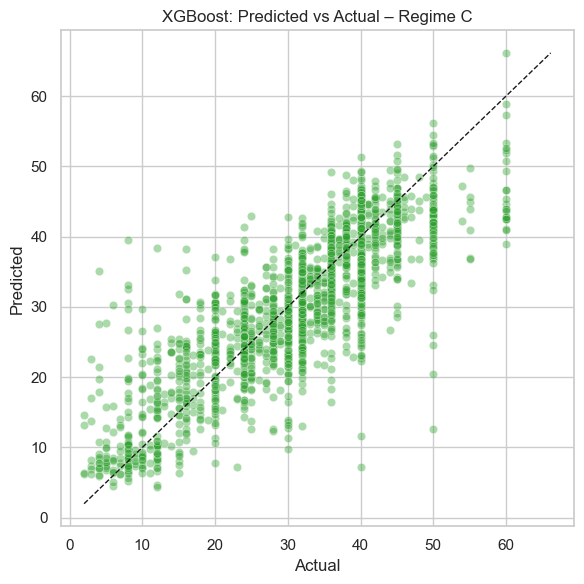


===== Regime A – Best Hyperparameters =====
MedianBaseline: None
Ridge: {'model__alpha': 10}
RandomForest: {'model__n_estimators': 300, 'model__min_samples_leaf': 2, 'model__max_features': 0.7, 'model__max_depth': 12}
XGBoost: {'model__subsample': 0.77, 'model__reg_lambda': 0.04, 'model__reg_alpha': 0.005, 'model__min_child_weight': 3, 'model__max_depth': 6, 'model__learning_rate': 0.05, 'model__gamma': 0.005, 'model__colsample_bytree': 0.75}

===== Regime B – Best Hyperparameters =====
MedianBaseline: None
Ridge: {'model__alpha': 10}
RandomForest: {'model__n_estimators': 300, 'model__min_samples_leaf': 2, 'model__max_features': 0.7, 'model__max_depth': 12}
XGBoost: {'model__subsample': 0.77, 'model__reg_lambda': 0.04, 'model__reg_alpha': 0.005, 'model__min_child_weight': 3, 'model__max_depth': 6, 'model__learning_rate': 0.05, 'model__gamma': 0.005, 'model__colsample_bytree': 0.75}

===== Regime C – Best Hyperparameters =====
MedianBaseline: None
Ridge: {'model__alpha': 10}
RandomFore

In [155]:
# RUN FULL EXPERIMENT FOR ALL REGIMES

ALL_RESULTS = {}

# Dictionary of regime names and their corresponding datasets
regimes = {
    "Regime A": df_regime_a,
    "Regime B": df_regime_b,
    "Regime C": df_regime_c
}

# Execute full modeling workflow for each regime
for regime_name, df_regime in regimes.items():
    ALL_RESULTS[regime_name] = run_all_models_for_regime(
        regime_name=regime_name,
        df=df_regime,
        config=GLOBAL_CONFIG
    )

# DISPLAY BEST PARAMETERS FOR EACH MODEL IN EACH REGIME

for regime_name, regime_data in ALL_RESULTS.items():
    print(f"\n===== {regime_name} – Best Hyperparameters =====")
    for model_name, model_res in regime_data["results"].items():
        print(f"{model_name}: {model_res['best_params_overall']}")


In [156]:
# MODEL COMPARISON TABLES AND STATISTICAL TESTS

for regime in ["Regime A", "Regime B", "Regime C"]:
    print(f"\n===== {regime} – Model Comparison =====")
    print(ALL_RESULTS[regime]["comparison_table"])

    print(f"\n===== {regime} – Statistical Tests =====")
    print(ALL_RESULTS[regime]["stats_table"])



===== Regime A – Model Comparison =====
     Regime           Model      RMSE       MAE        R2  RMSE_CI_Lower  \
0  Regime A  MedianBaseline  0.644500  0.425385 -0.149589       0.617586   
3  Regime A         XGBoost  6.562515  4.886611  0.762150       6.327404   
2  Regime A    RandomForest  7.347356  5.337745  0.701857       7.109732   
1  Regime A           Ridge  8.272375  6.418074  0.622060       8.074980   

   RMSE_CI_Upper  
0       0.671368  
3       6.782591  
2       7.603486  
1       8.491241  

===== Regime A – Statistical Tests =====
     Regime         Model 1       Model 2  Paired t-stat    Paired t-p  \
0  Regime A  MedianBaseline         Ridge      -2.761595  5.786292e-03   
1  Regime A  MedianBaseline  RandomForest       5.207724  2.038195e-07   
2  Regime A  MedianBaseline       XGBoost       5.151601  2.746403e-07   
3  Regime A           Ridge  RandomForest       9.468124  5.502395e-21   
4  Regime A           Ridge       XGBoost      11.348809  2.866827e-29 

# SHAP Analyses

## Within-Regime SHAP Analysis


SHAP ANALYSIS FOR Regime A

 Best model for Regime A: MedianBaseline
Baseline model selected; overriding for SHAP.
 Using XGBoost instead.

INTERPRETABILITY EXTRACTION FOR Regime A

Target encoding mapping for 005_target:
None

Target encoding mapping for 008_target:
None


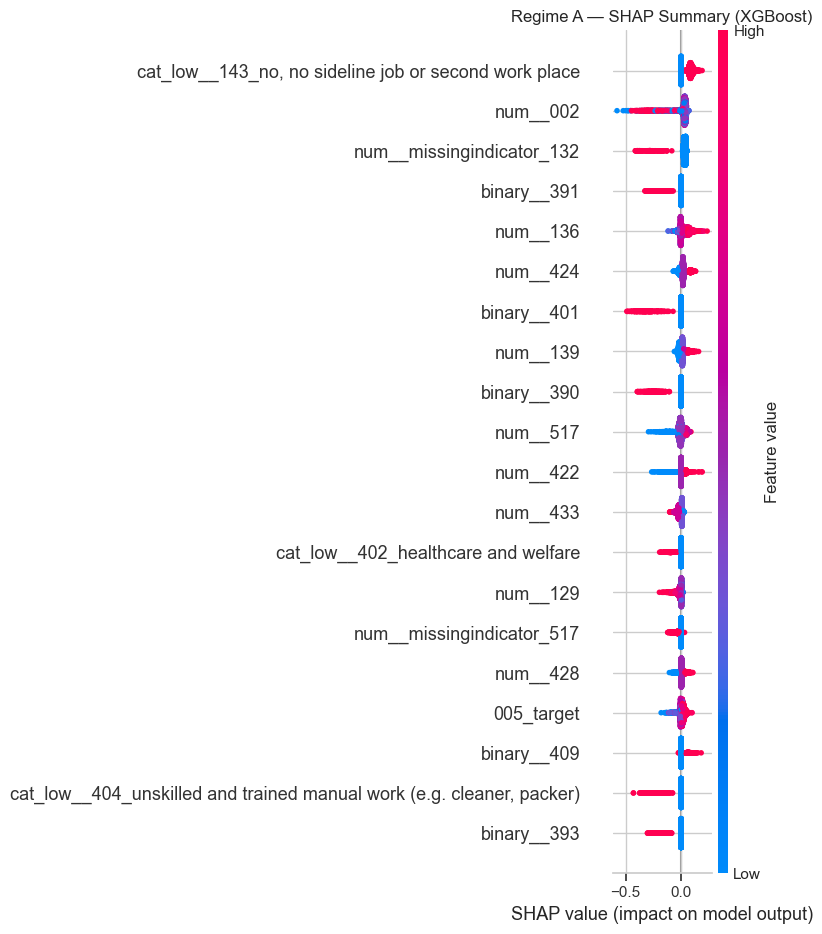

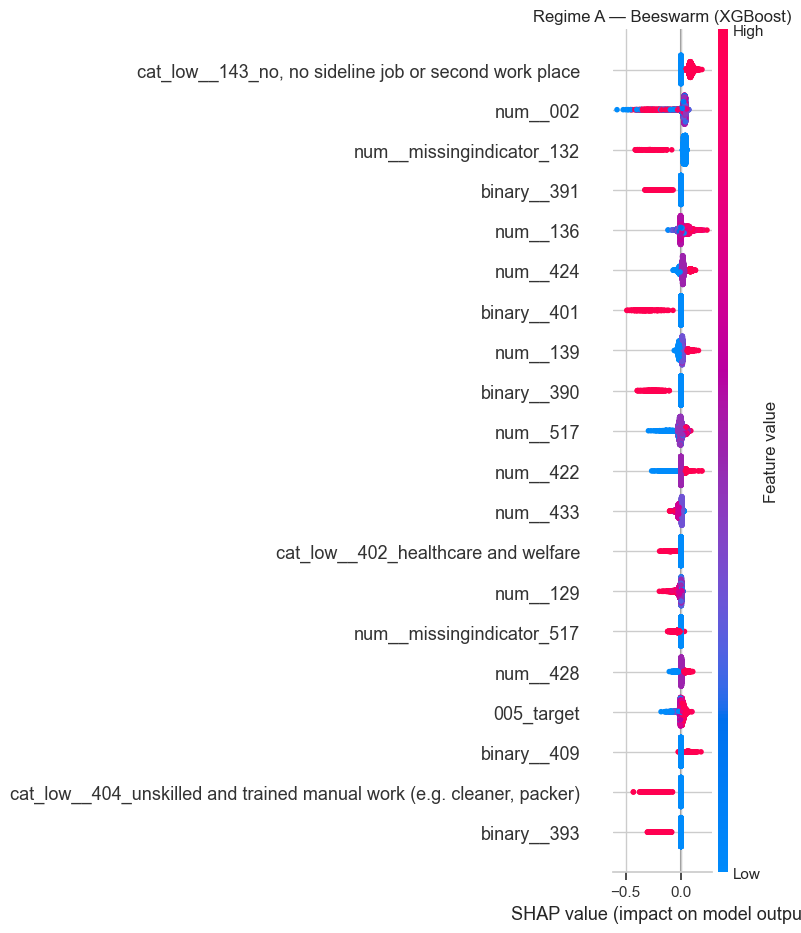

C:\Users\shari\anaconda3\Lib\site-packages\shap\plots\_scatter.py:641: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)
C:\Users\shari\AppData\Local\Temp\ipykernel_9228\1389872257.py:175: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 6))
C:\Users\shari\AppData\Local\Temp\ipykernel_9228\1389872257.py:176: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

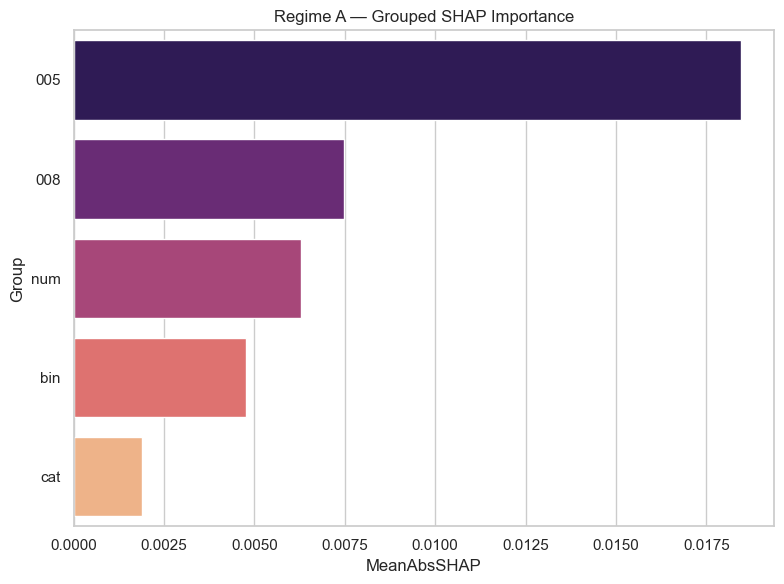


SHAP ANALYSIS FOR Regime B

 Best model for Regime B: MedianBaseline
Baseline model selected; overriding for SHAP.
 Using XGBoost instead.

INTERPRETABILITY EXTRACTION FOR Regime B

Target encoding mapping for 005_target:
None

Target encoding mapping for 008_target:
None

Target encoding mapping for 051_target:
None

Target encoding mapping for 068_target:
None

Target encoding mapping for 075_target:
None


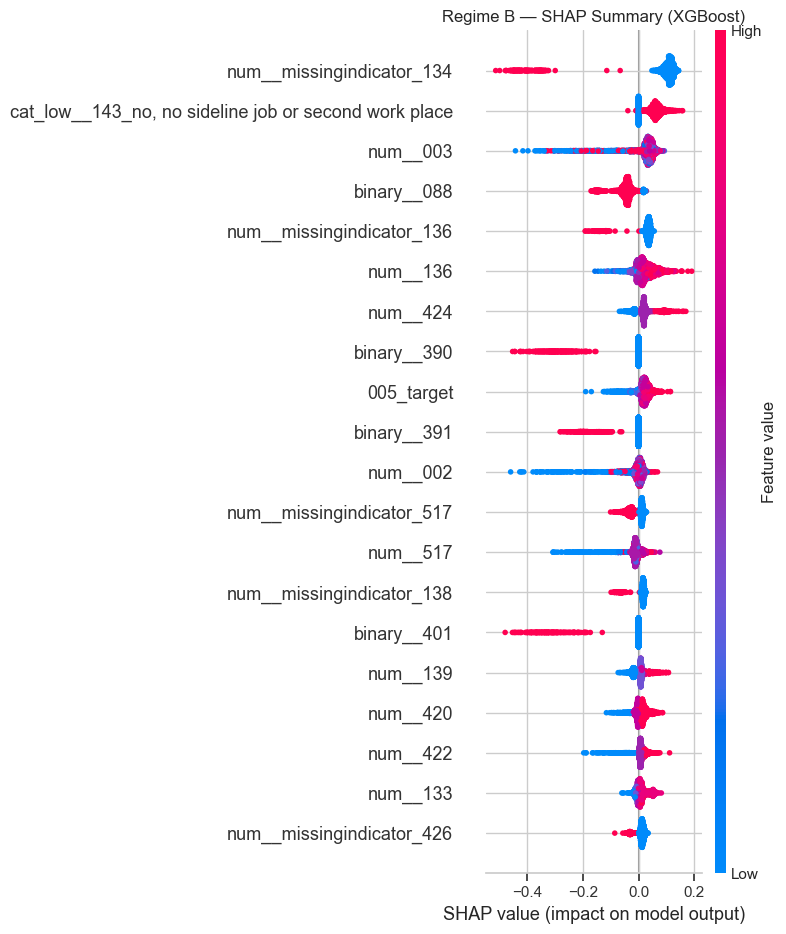

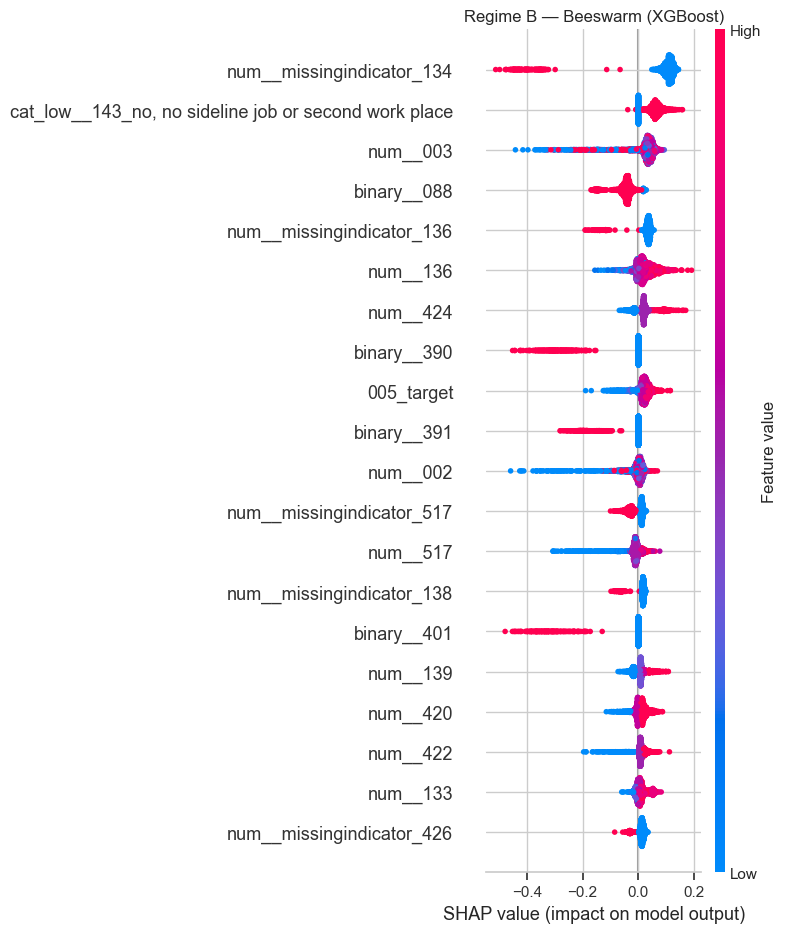

C:\Users\shari\anaconda3\Lib\site-packages\shap\plots\_scatter.py:641: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)
C:\Users\shari\AppData\Local\Temp\ipykernel_9228\1389872257.py:175: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 6))
C:\Users\shari\AppData\Local\Temp\ipykernel_9228\1389872257.py:176: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

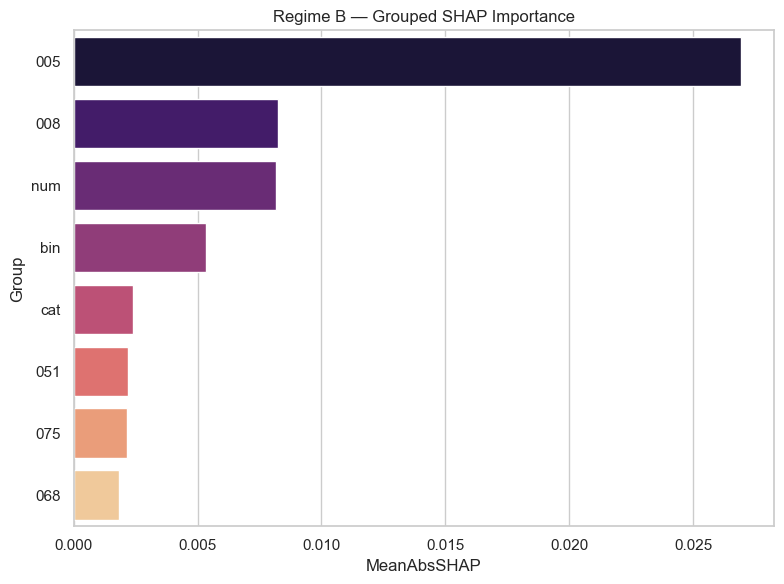


SHAP ANALYSIS FOR Regime C

 Best model for Regime C: MedianBaseline
Baseline model selected; overriding for SHAP.
 Using XGBoost instead.

INTERPRETABILITY EXTRACTION FOR Regime C

Target encoding mapping for 005_target:
None

Target encoding mapping for 008_target:
None

Target encoding mapping for 611_target:
None


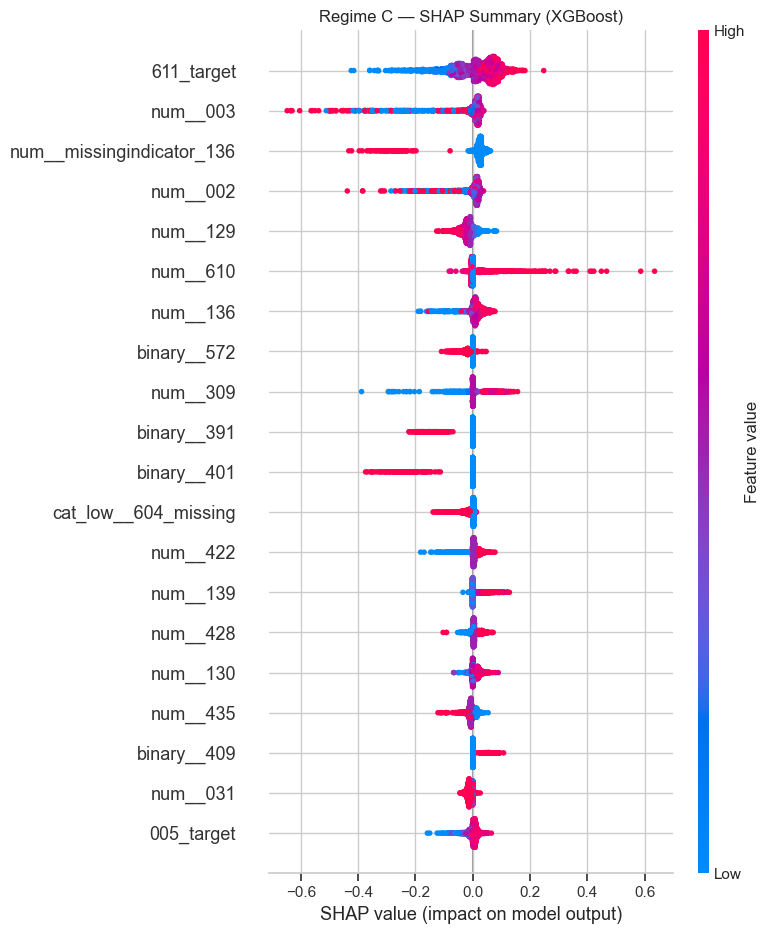

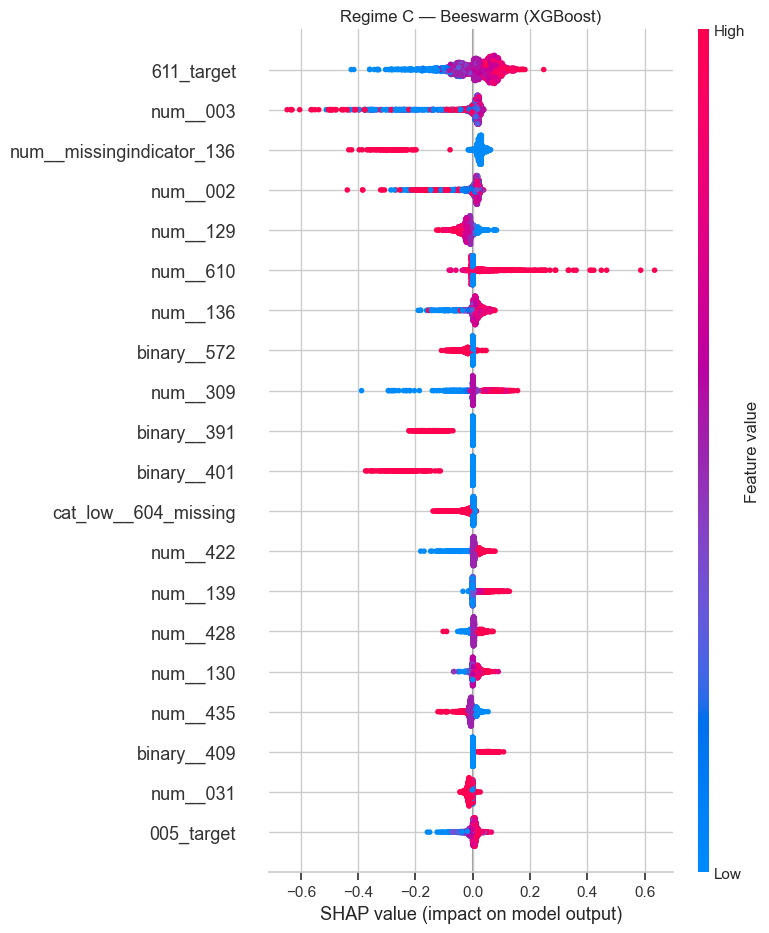

C:\Users\shari\anaconda3\Lib\site-packages\shap\plots\_scatter.py:641: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)
C:\Users\shari\AppData\Local\Temp\ipykernel_9228\1389872257.py:175: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8, 6))
C:\Users\shari\AppData\Local\Temp\ipykernel_9228\1389872257.py:176: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

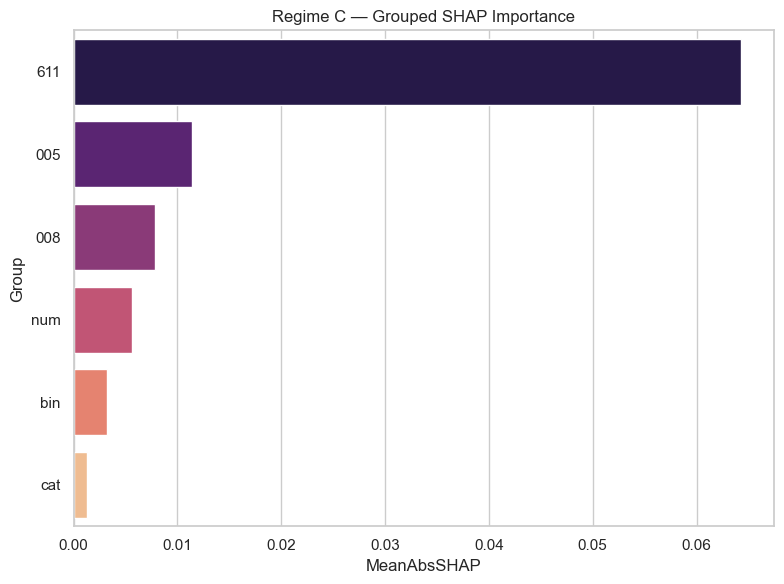


TOP 20 FEATURES FOR Regime A
cat_low__143_no, no sideline job or second work place  SHAP = 0.0828
num__002                                  SHAP = 0.0570
num__missingindicator_132                 SHAP = 0.0447
binary__391                               SHAP = 0.0355
num__136                                  SHAP = 0.0355
num__424                                  SHAP = 0.0271
binary__401                               SHAP = 0.0253
num__139                                  SHAP = 0.0241
binary__390                               SHAP = 0.0223
num__517                                  SHAP = 0.0218
num__422                                  SHAP = 0.0216
num__433                                  SHAP = 0.0212
cat_low__402_healthcare and welfare       SHAP = 0.0204
num__129                                  SHAP = 0.0189
num__missingindicator_517                 SHAP = 0.0187
num__428                                  SHAP = 0.0187
005_target                                SHAP = 0.0185
binar

In [219]:
# RUN SHAP FOR ALL REGIMES (RAW SHAP OUTPUTS)
raw_shap_outputs = run_shap_all_regimes(
    ALL_RESULTS,
    GLOBAL_CONFIG,
    save_dir="shap_plots",
    top_n=20
)

for regime, results in raw_shap_outputs.items():
    print("\n" + "="*60)
    print(f"TOP 20 FEATURES FOR {regime}")
    print("="*60)

    for name, value in results["top20_features"]:
        print(f"{name:40s}  SHAP = {value:.4f}")


## Across-Regime (Balanced) SHAP Analysis

In [226]:
# Identify features that appear in ALL regimes
common_features = get_common_features(raw_shap_outputs)
print(f"Common features across all regimes: {len(common_features)}")


Common features across all regimes: 179



Running balanced SHAP for Regime A

TOP 20 BALANCED SHAP FEATURES FOR Regime A
 1. cat_low__404_unskilled and trained manual work (e.g. cleaner, packer) SHAP = 0.0579
 2. num__002                                 SHAP = 0.0546
 3. binary__391                              SHAP = 0.0472
 4. num__136                                 SHAP = 0.0451
 5. binary__393                              SHAP = 0.0423
 6. num__missingindicator_131                SHAP = 0.0379
 7. num__424                                 SHAP = 0.0332
 8. num__422                                 SHAP = 0.0327
 9. cat_low__143_no, no sideline job or second work place SHAP = 0.0322
10. binary__400                              SHAP = 0.0317
11. num__139                                 SHAP = 0.0260
12. num__129                                 SHAP = 0.0244
13. binary__401                              SHAP = 0.0238
14. binary__409                              SHAP = 0.0236
15. binary__390                              SHAP = 

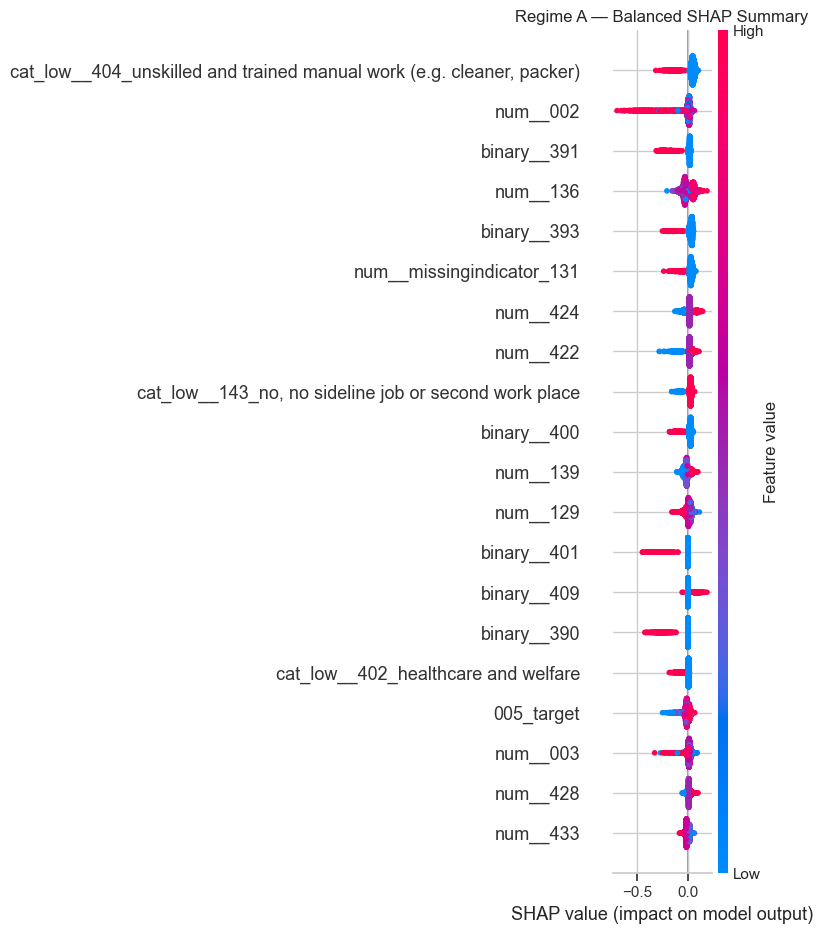

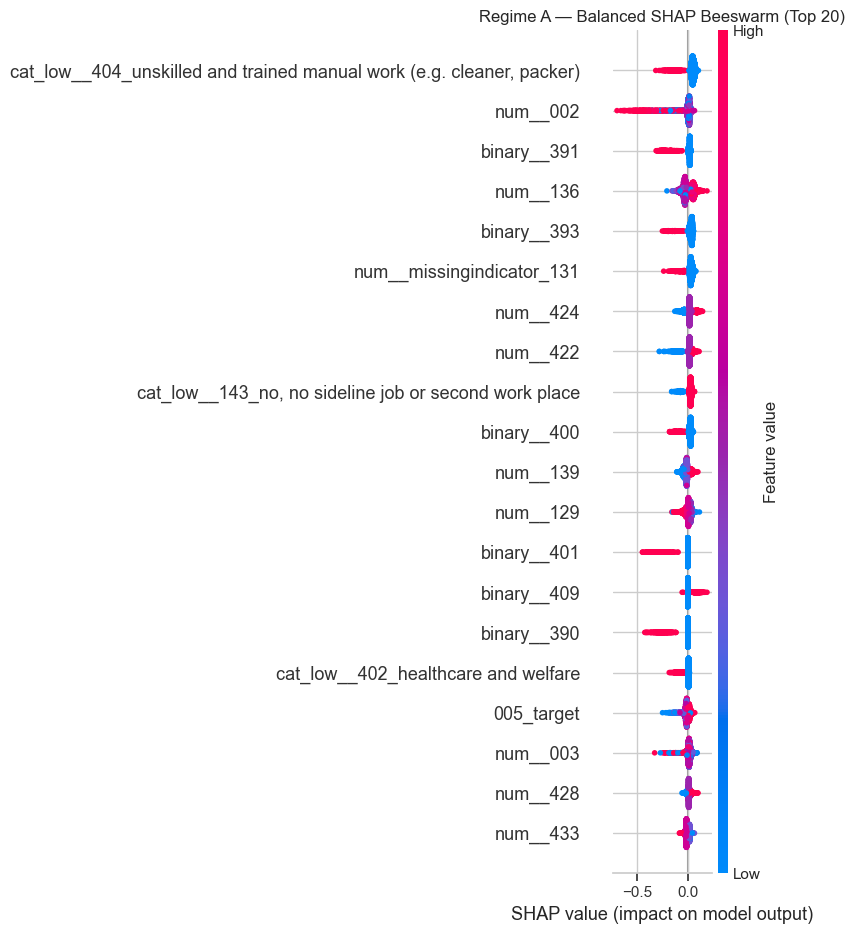


Running balanced SHAP for Regime B

TOP 20 BALANCED SHAP FEATURES FOR Regime B
 1. binary__510                              SHAP = 0.0816
 2. binary__390                              SHAP = 0.0578
 3. binary__391                              SHAP = 0.0404
 4. num__missingindicator_134                SHAP = 0.0379
 5. num__003                                 SHAP = 0.0342
 6. num__139                                 SHAP = 0.0270
 7. num__136                                 SHAP = 0.0238
 8. num__424                                 SHAP = 0.0231
 9. num__002                                 SHAP = 0.0230
10. binary__401                              SHAP = 0.0193
11. binary__409                              SHAP = 0.0188
12. 005_target                               SHAP = 0.0184
13. num__133                                 SHAP = 0.0182
14. num__420                                 SHAP = 0.0171
15. cat_low__402_healthcare and welfare      SHAP = 0.0170
16. cat_low__404_unskilled and trai

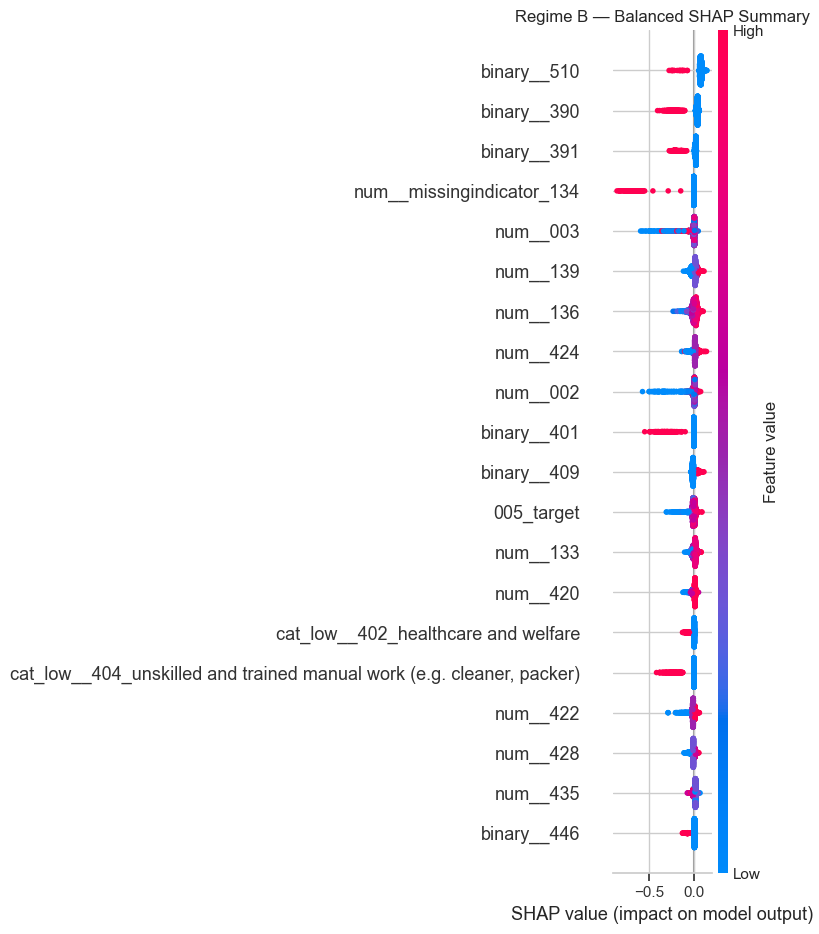

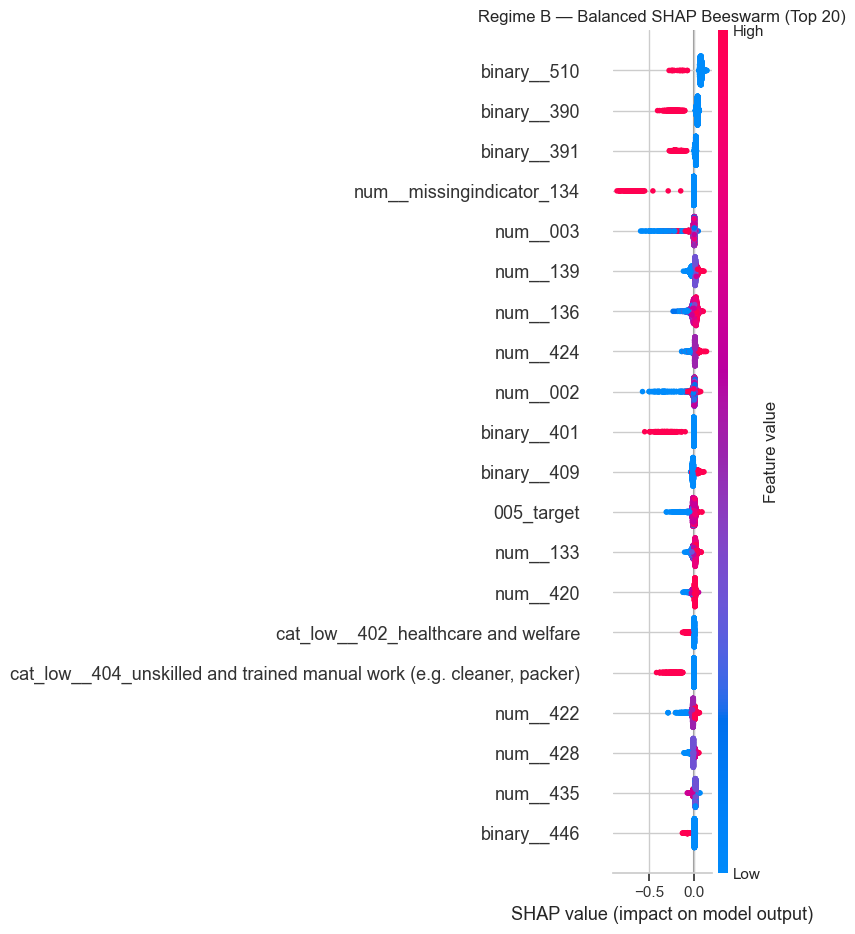


Running balanced SHAP for Regime C

TOP 20 BALANCED SHAP FEATURES FOR Regime C
 1. binary__391                              SHAP = 0.0839
 2. binary__401                              SHAP = 0.0613
 3. num__003                                 SHAP = 0.0477
 4. num__002                                 SHAP = 0.0342
 5. num__138                                 SHAP = 0.0297
 6. num__134                                 SHAP = 0.0252
 7. cat_low__402_healthcare and welfare      SHAP = 0.0242
 8. cat_low__143_yes, my own business or partnership, not mentioned so far SHAP = 0.0242
 9. binary__393                              SHAP = 0.0240
10. binary__409                              SHAP = 0.0234
11. num__136                                 SHAP = 0.0208
12. num__435                                 SHAP = 0.0180
13. num__128                                 SHAP = 0.0173
14. binary__400                              SHAP = 0.0171
15. binary__021                              SHAP = 0.0168
16. 0

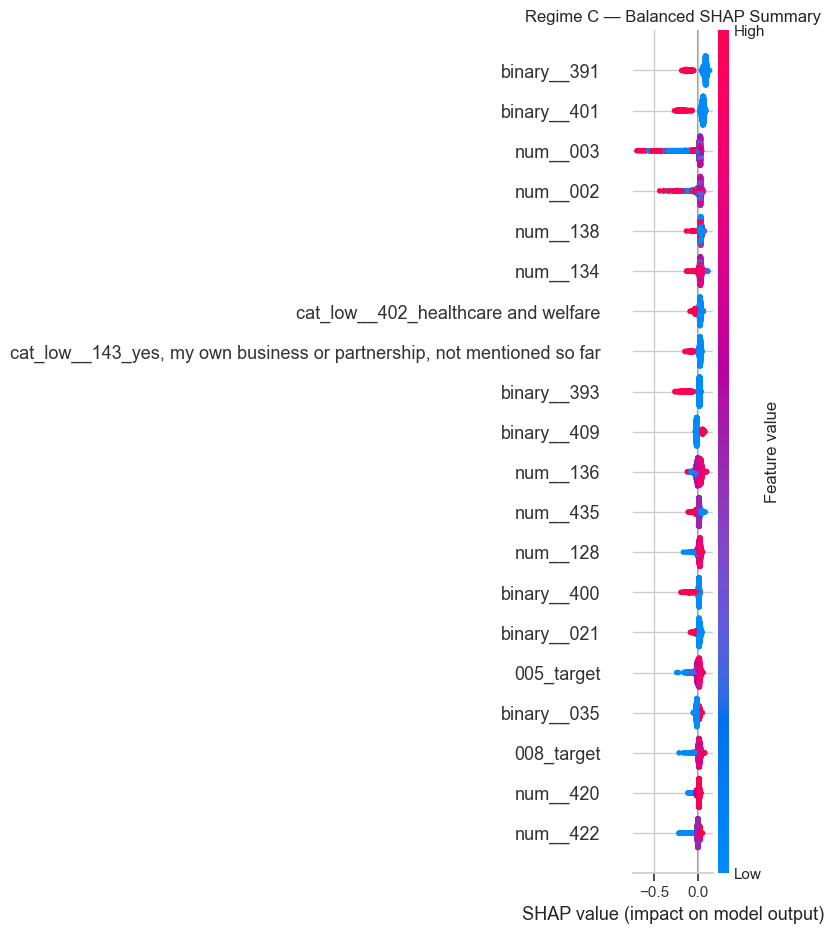

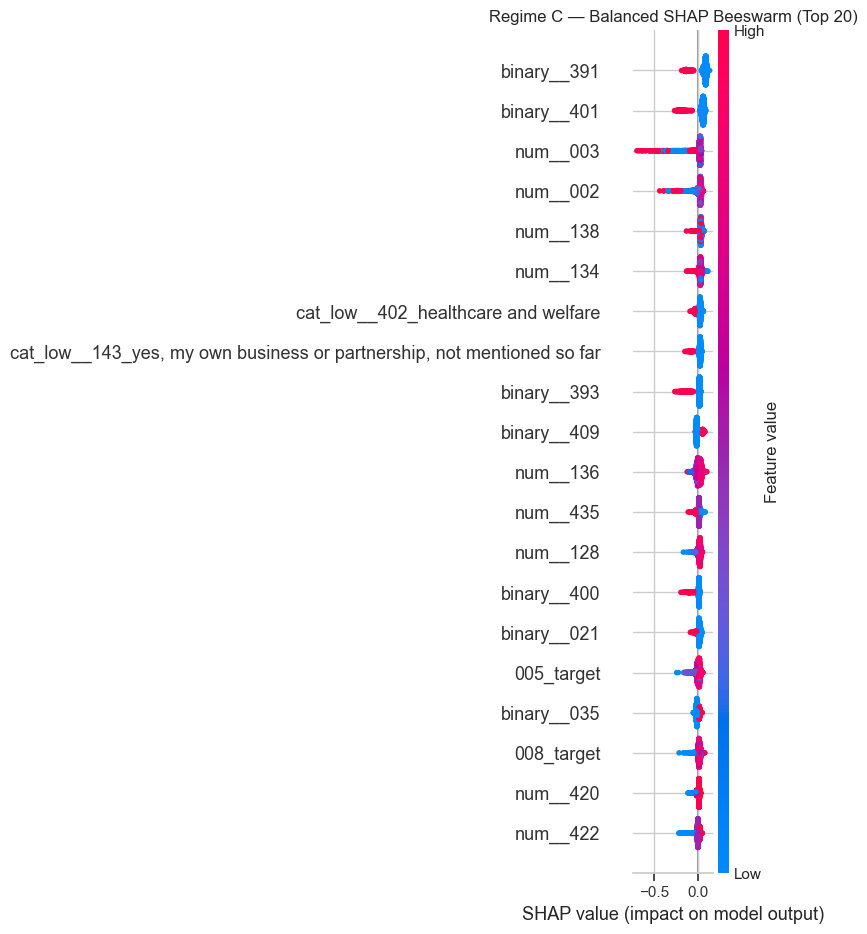

In [231]:
balanced_shap_outputs = {}

for regime_name in raw_shap_outputs.keys():
    print(f"\nRunning balanced SHAP for {regime_name}")

    balanced_shap_outputs[regime_name] = run_balanced_shap_for_best_model(
        ALL_RESULTS,
        regime_name,
        GLOBAL_CONFIG,
        common_features,
        save_dir="shap_plots_balanced",
        top_n=20
    )


## Cross-Regime SHAP Comparison

In [245]:
# Build rank matrix across regimes
rank_df_global = build_rank_df_from_balanced_outputs(balanced_shap_outputs)

# Across-regime Spearman correlations
across_rank_corr_df = across_regime_spearman(rank_df_global)

# Rank variance across regimes
across_rank_variance = across_regime_rank_variance(rank_df_global, top_n=20)

# Most stable / volatile features
most_stable_features = across_rank_variance.head(10)
most_volatile_features = across_rank_variance.tail(10)

# Display
across_rank_corr_df
across_rank_variance.to_frame("Rank Variance")

print("\n" + "="*80)
print("PAIRWISE SPEARMAN CORRELATIONS ACROSS REGIMES")
print("="*80)
display(across_rank_corr_df)

print("\n" + "="*80)
print("MEAN SPEARMAN CORRELATION ACROSS ALL REGIME PAIRS")
print("="*80)
mean_spearman = across_spearman_mean(rank_df_global)
print(f"Mean Spearman rho: {mean_spearman['mean_spearman_rho']:.4f}")
print(f"Mean p-value:       {mean_spearman['mean_p_value']:.4f}")

print("\n" + "="*80)
print("RANK VARIANCE ACROSS REGIMES (TOP 20 FEATURES)")
print("="*80)
display(across_rank_variance.to_frame("Rank Variance"))

print("\n" + "="*80)
print("MOST STABLE FEATURES (LOWEST VARIANCE)")
print("="*80)
display(most_stable_features.to_frame("Rank Variance"))

print("\n" + "="*80)
print("MOST VOLATILE FEATURES (HIGHEST VARIANCE)")
print("="*80)
display(most_volatile_features.to_frame("Rank Variance"))




PAIRWISE SPEARMAN CORRELATIONS ACROSS REGIMES


,Regime Pair,Spearman rho,p-value
0,Regime A vs Regime B,0.240569,0.177471
1,Regime A vs Regime C,0.047687,0.792144
2,Regime B vs Regime C,-0.006406,0.971777



MEAN SPEARMAN CORRELATION ACROSS ALL REGIME PAIRS
Mean Spearman rho: 0.0940
Mean p-value:       0.6471

RANK VARIANCE ACROSS REGIMES (TOP 20 FEATURES)


,Rank Variance
binary__391,1.333333
binary__409,4.333333
005_target,7.000000
num__136,12.333333
num__002,13.000000
cat_low__402_healthcare and welfare,24.333333
binary__400,31.000000
binary__401,32.333333
num__422,39.000000
num__139,58.333333



MOST STABLE FEATURES (LOWEST VARIANCE)


,Rank Variance
binary__391,1.333333
binary__409,4.333333
005_target,7.000000
num__136,12.333333
num__002,13.000000
cat_low__402_healthcare and welfare,24.333333
binary__400,31.000000
binary__401,32.333333
num__422,39.000000
num__139,58.333333



MOST VOLATILE FEATURES (HIGHEST VARIANCE)


,Rank Variance
num__424,61.000000
num__003,66.333333
binary__393,69.333333
num__134,75.000000
num__missingindicator_131,75.000000
num__138,85.333333
binary__390,94.333333
num__missingindicator_134,96.333333
"cat_low__404_unskilled and trained manual work (e.g. cleaner, packer)",108.333333
binary__510,133.333333


## VIsualisation & Readable Names

In [188]:
renamed_features = rename_top_features(raw_shap_outputs, READABLE_NAMES)

In [189]:
replot_shap_with_readable_names(raw_shap_outputs, READABLE_NAMES)


## Subgroup Analyses

In [248]:
## Within a single regime, how do different subgroups of people differ in what drives their predicted outcomes?”

### Subgroup Analysis Within Regime for Each subgroup


 SHAP SUBGROUP ANALYSIS — Regime A

SHAP Analysis for subgroup: Young


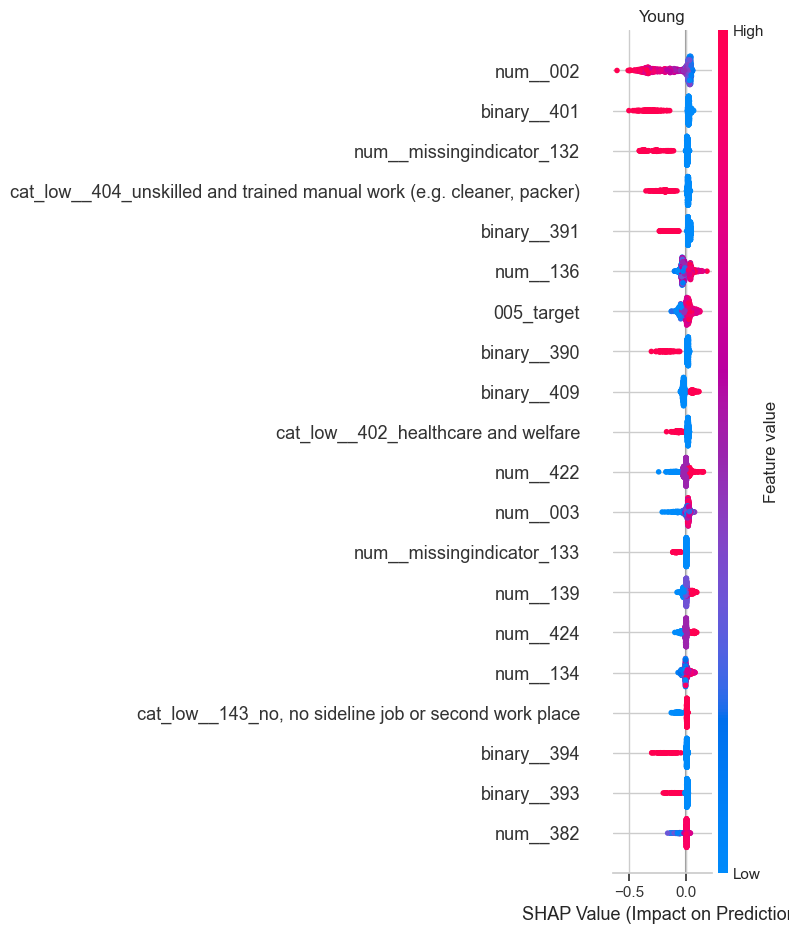


SHAP Analysis for subgroup: Mid-career


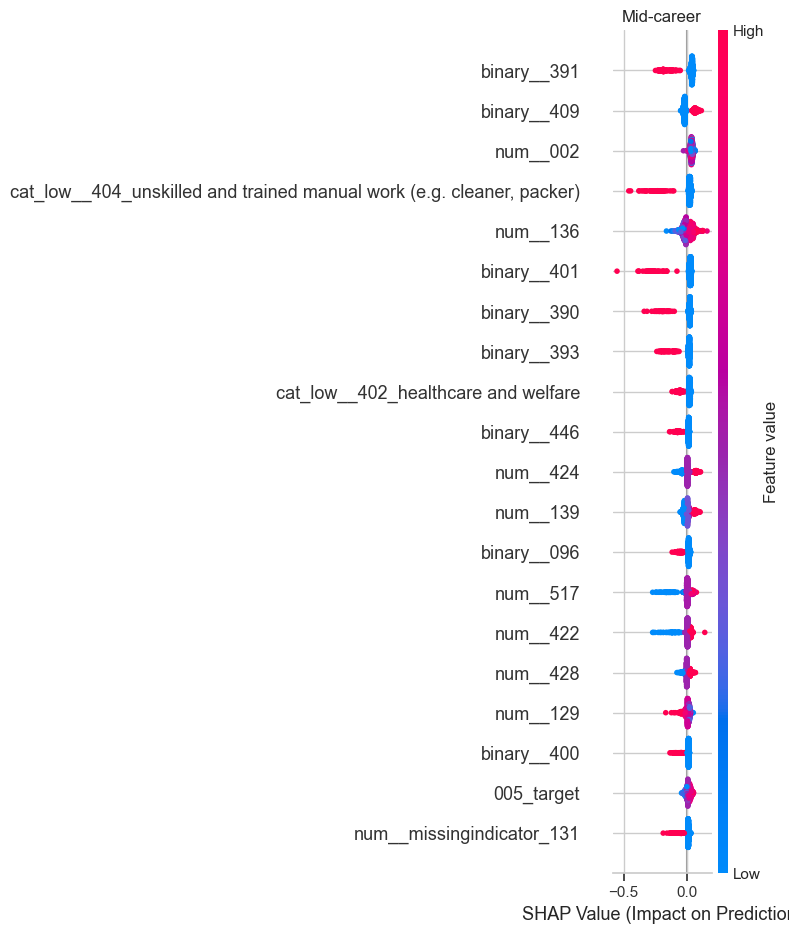


SHAP Analysis for subgroup: Older


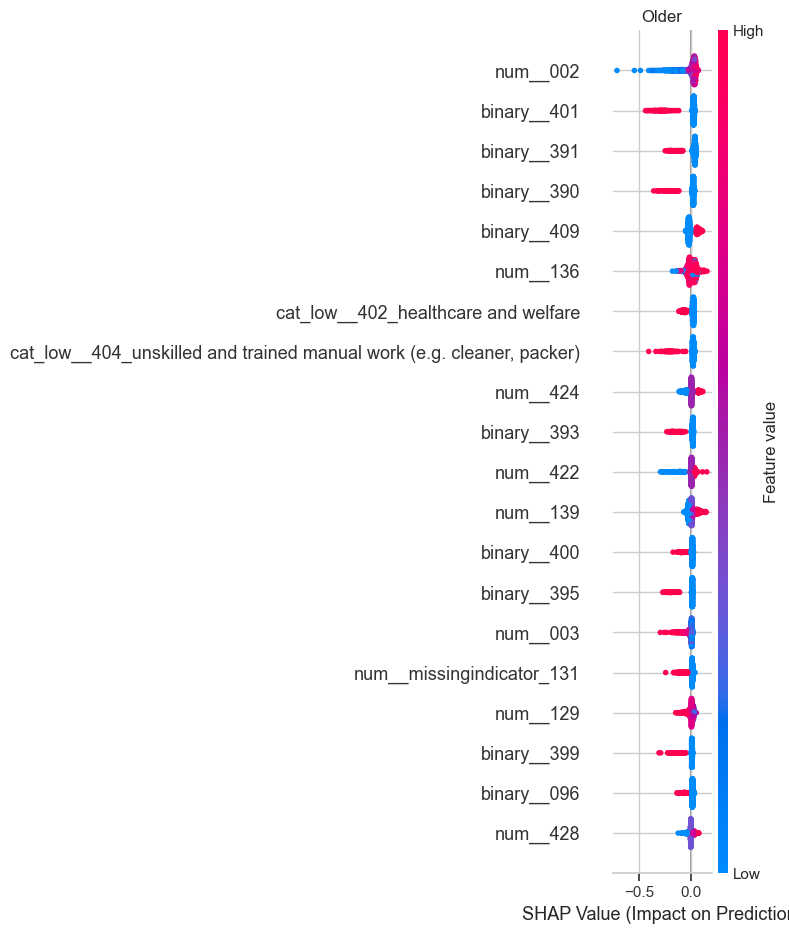


SHAP Analysis for subgroup: Trade & Market Services


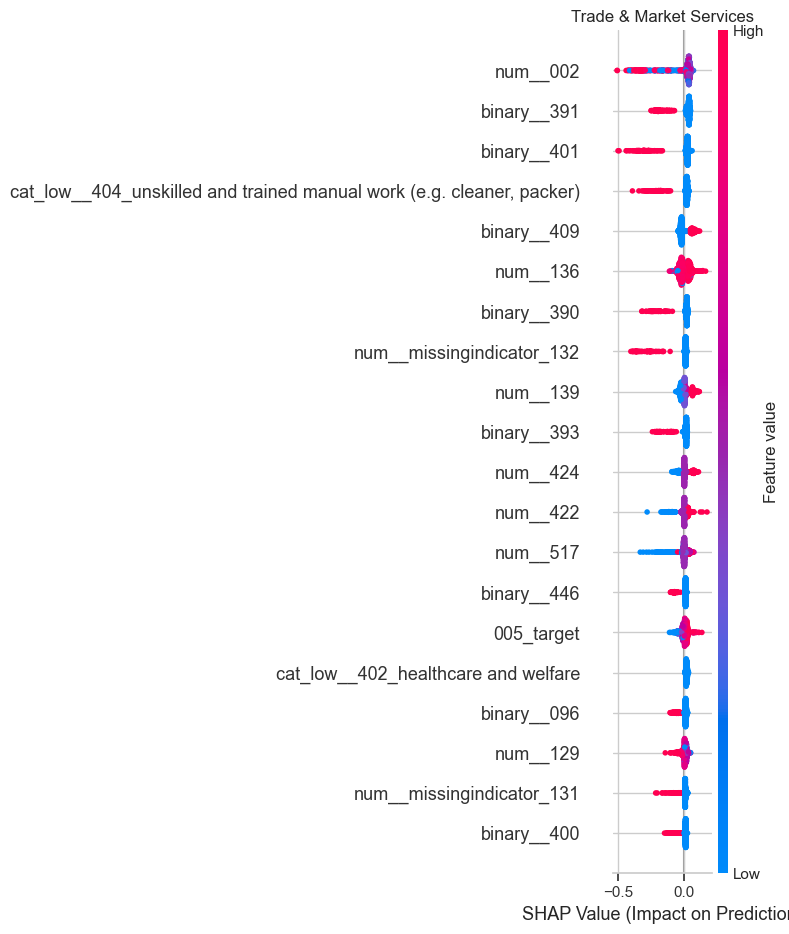


SHAP Analysis for subgroup: Culture & Other Services


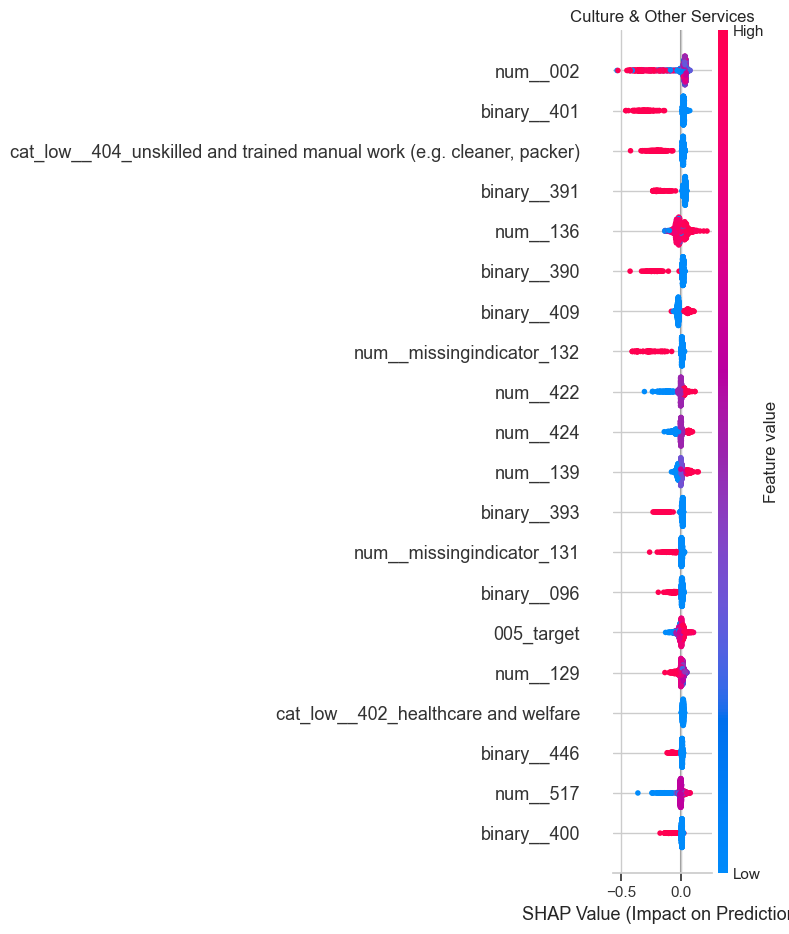


SHAP Analysis for subgroup: Production & Construction


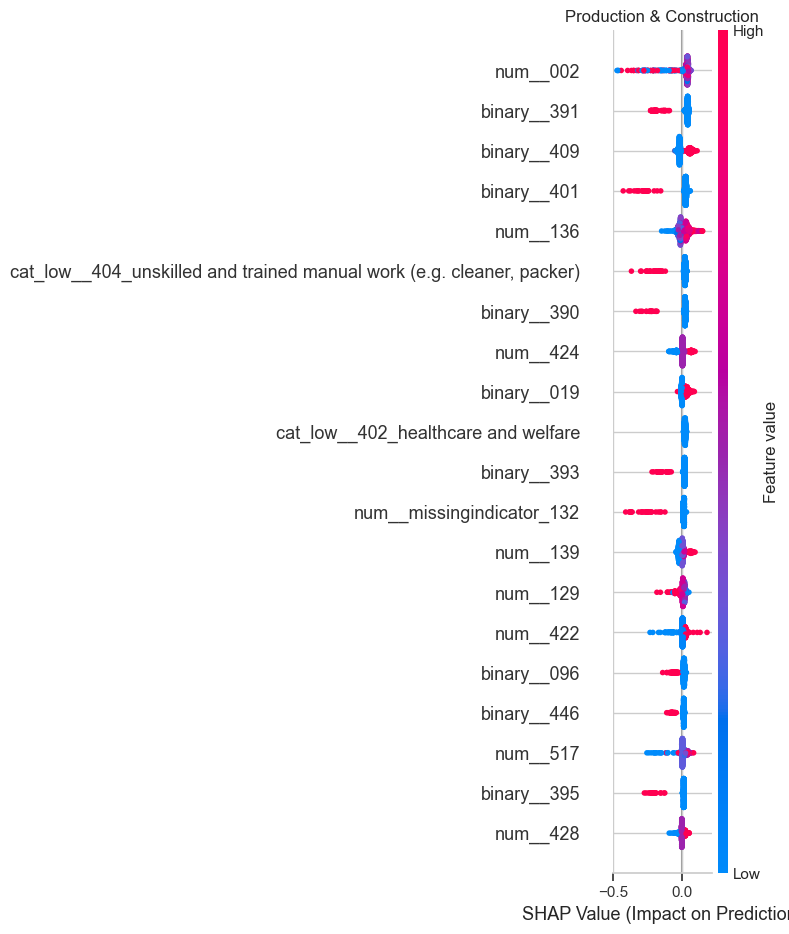


SHAP Analysis for subgroup: Public & Social Services


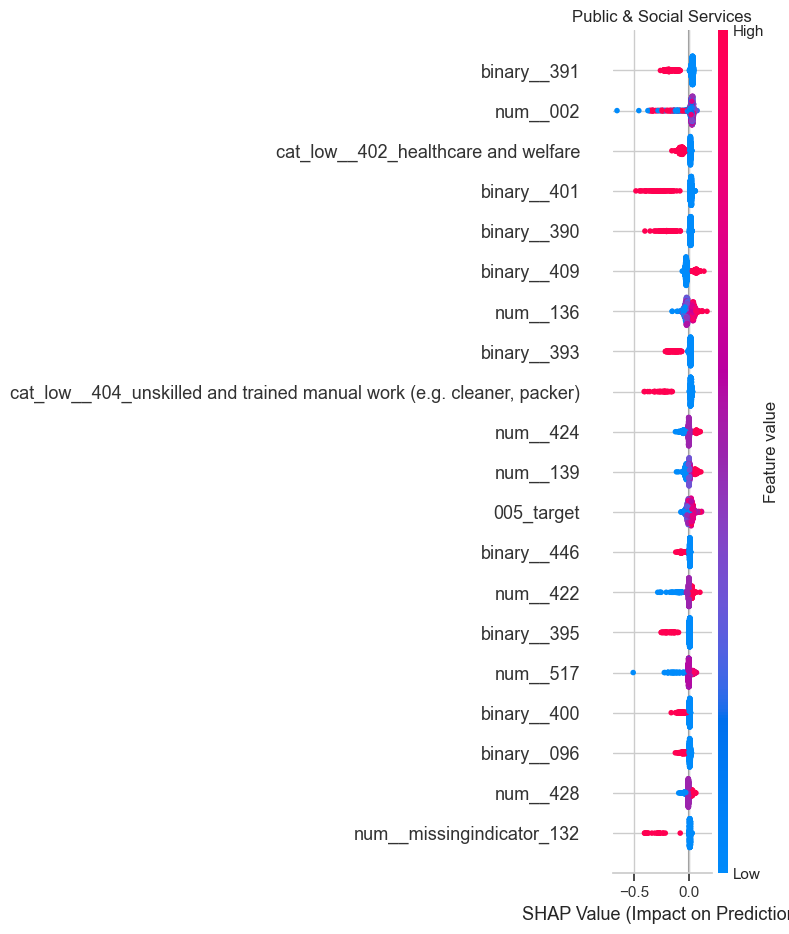


SHAP Analysis for subgroup: Agriculture & Extraction


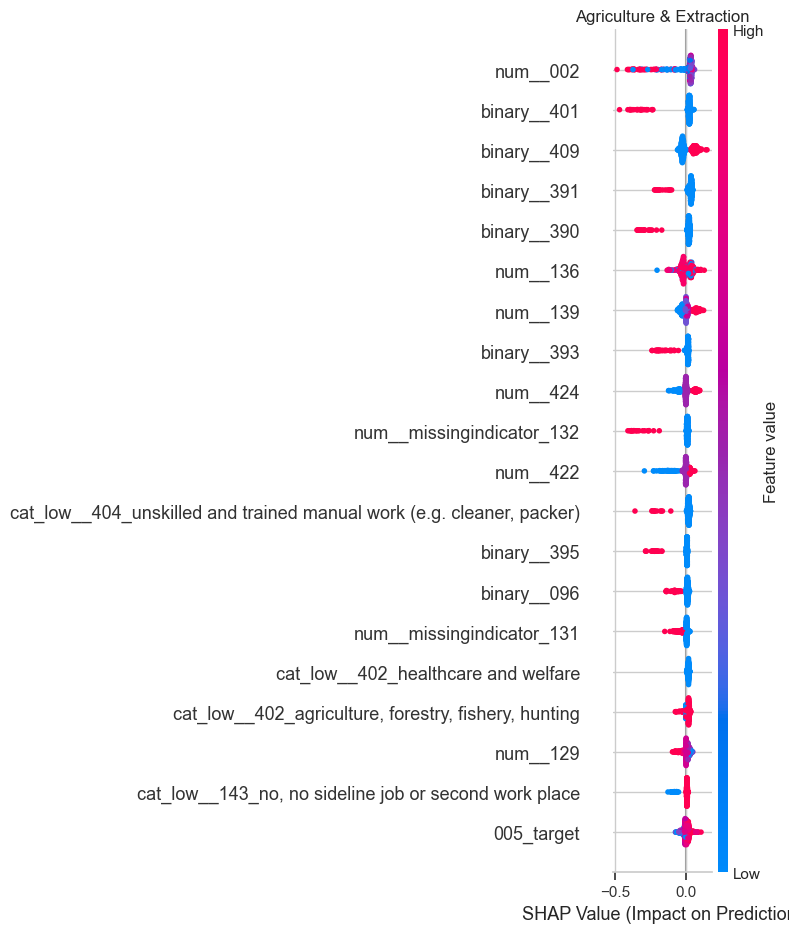


SHAP Analysis for subgroup: Other


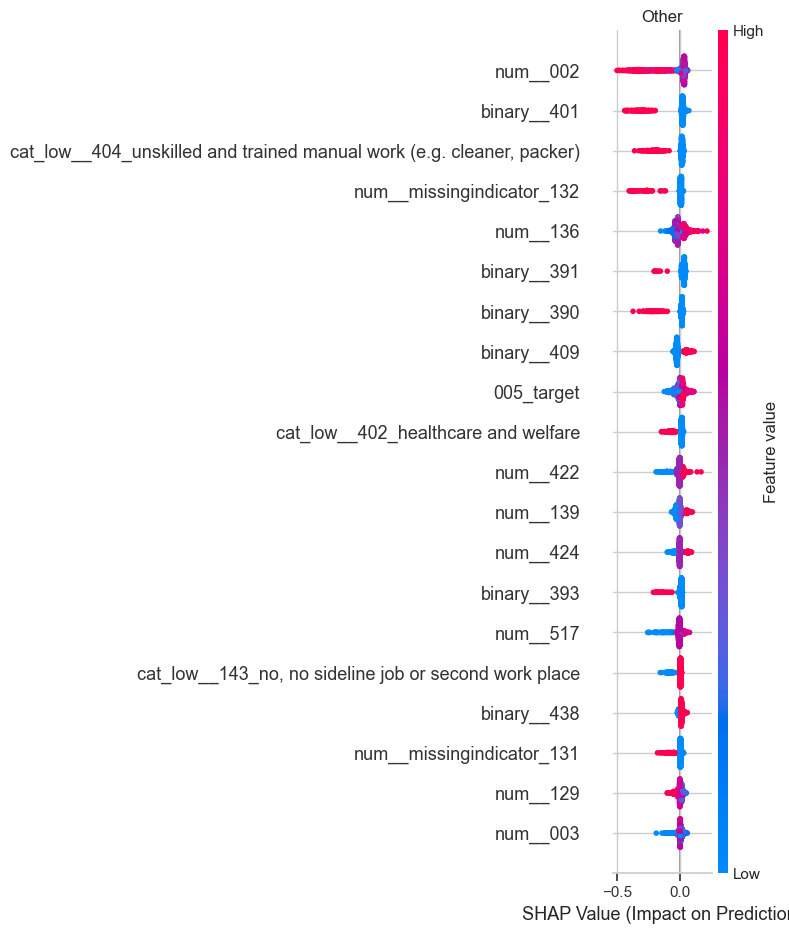


SHAP Analysis for subgroup: Children


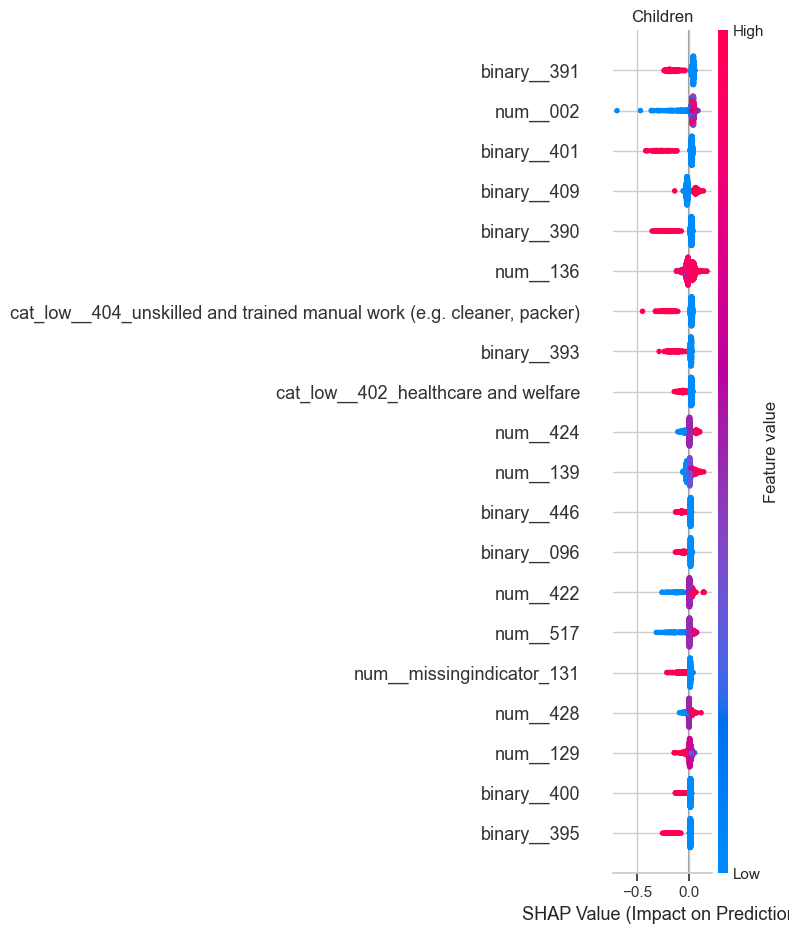


SHAP Analysis for subgroup: Caregiver


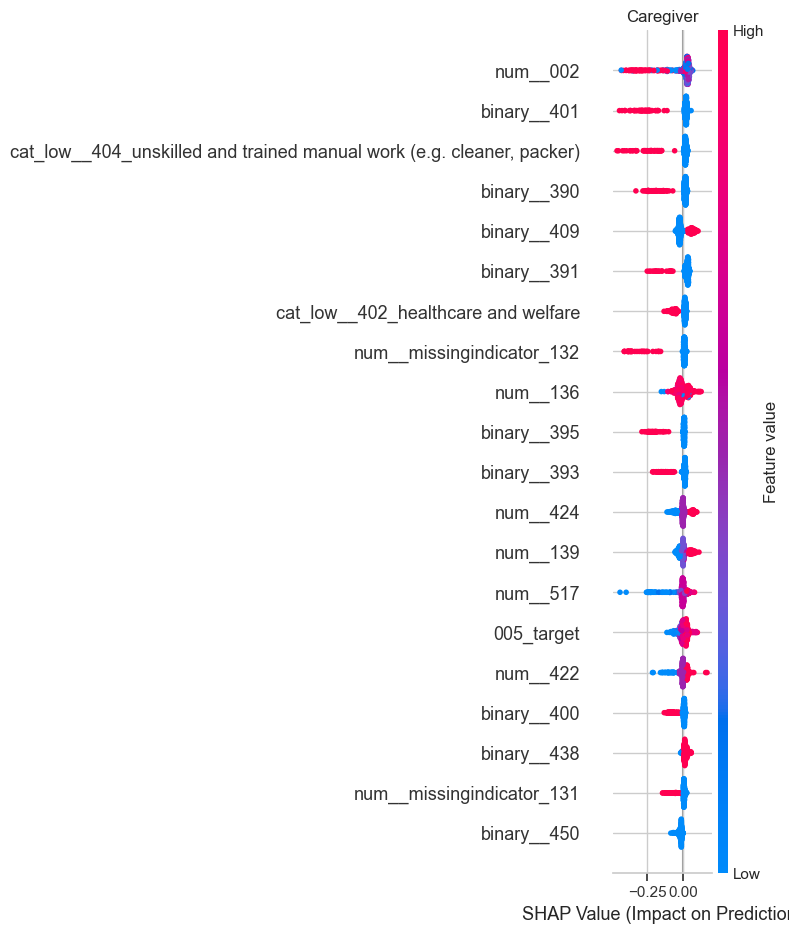


SHAP Analysis for subgroup: Education


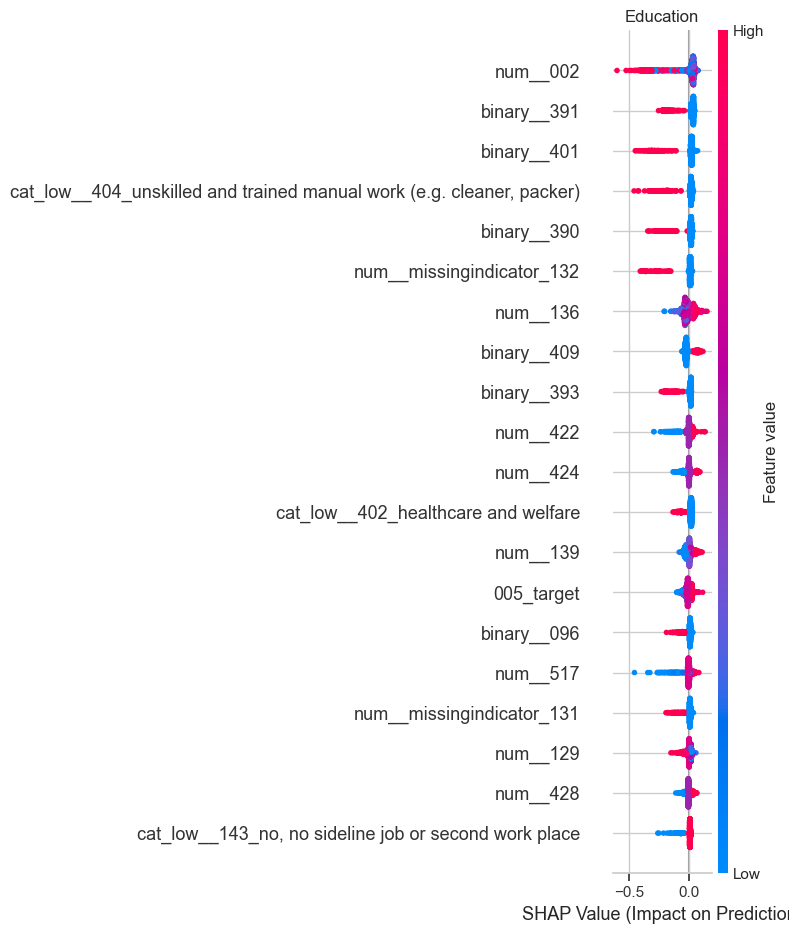


SHAP Analysis for subgroup: STEM


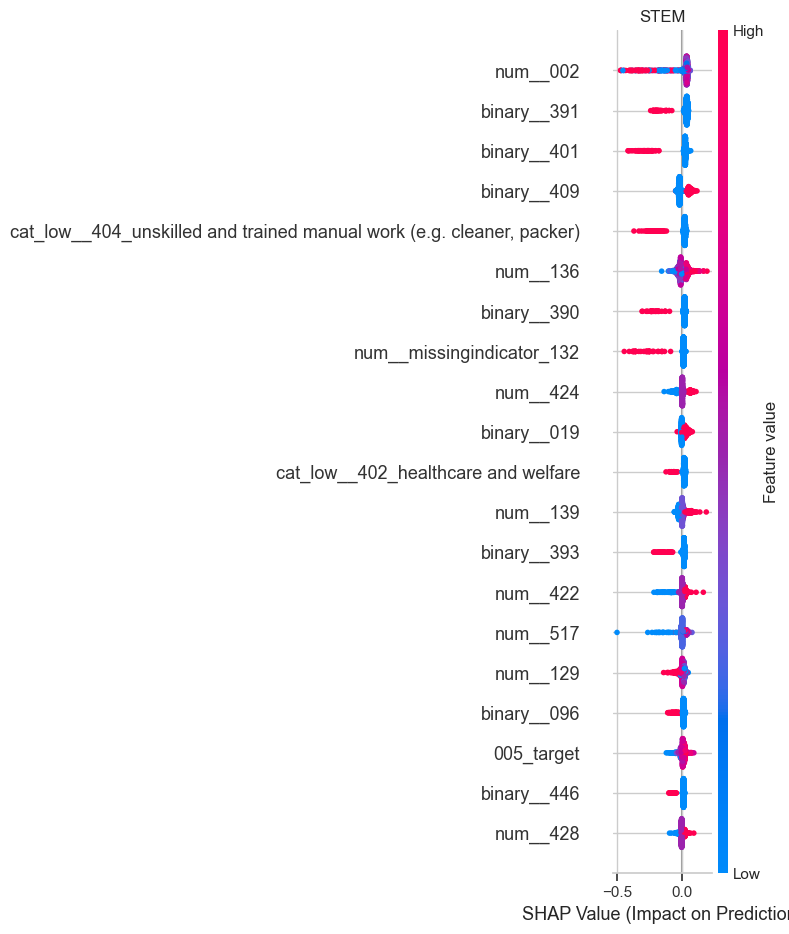


SHAP Analysis for subgroup: Business_Law


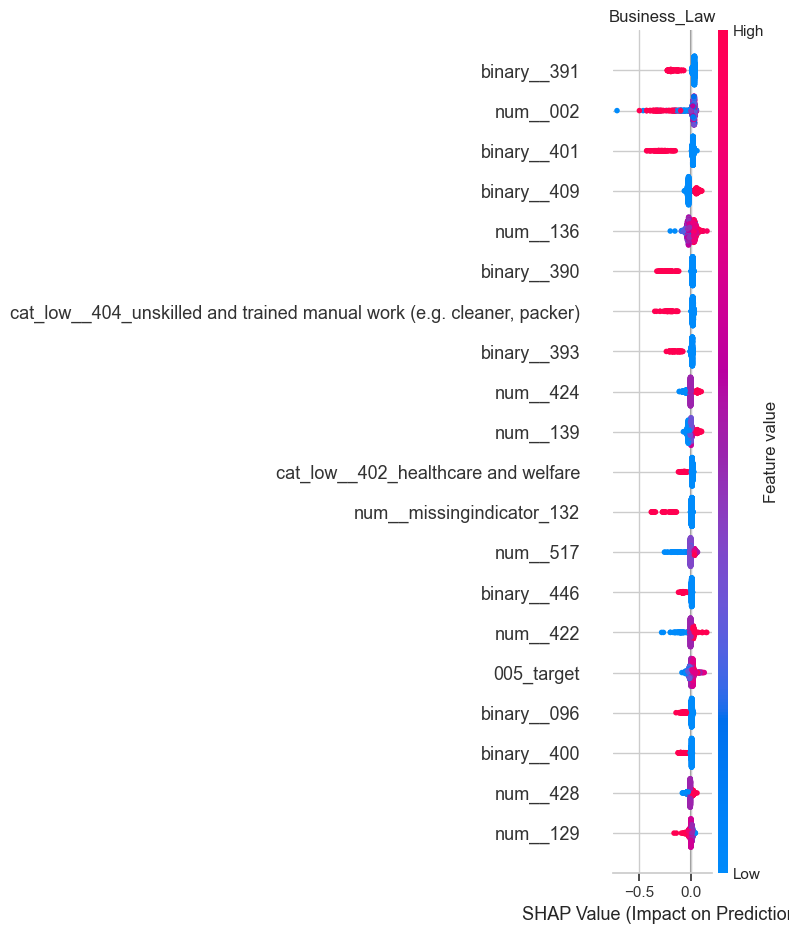


SHAP Analysis for subgroup: Health_Care


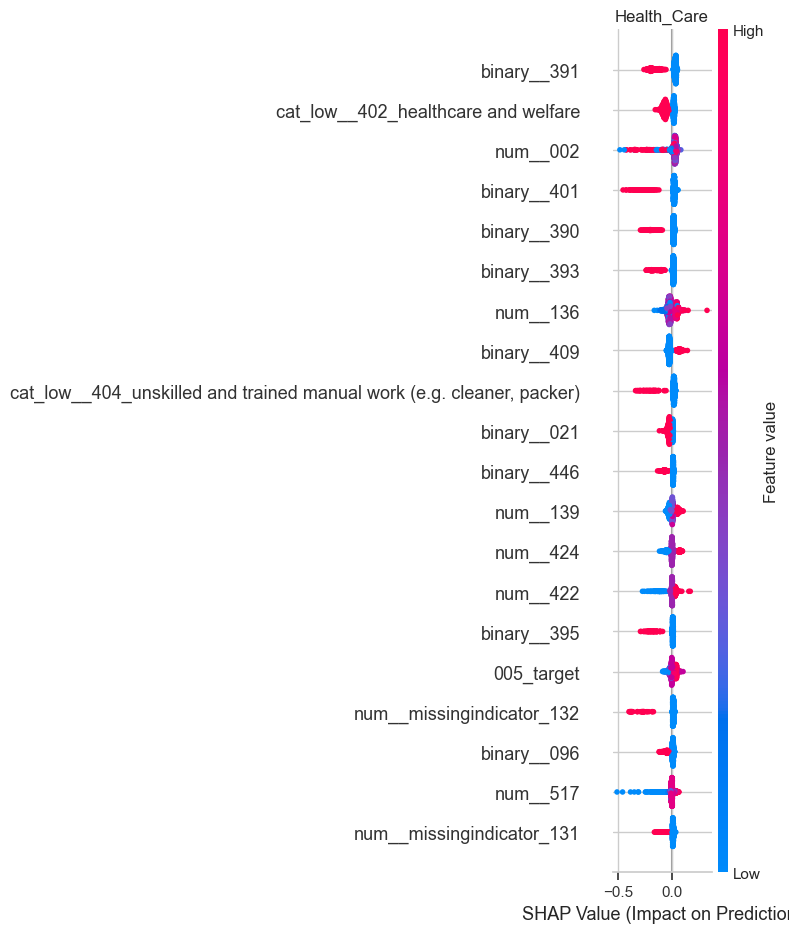


SHAP Analysis for subgroup: Arts_Humanities


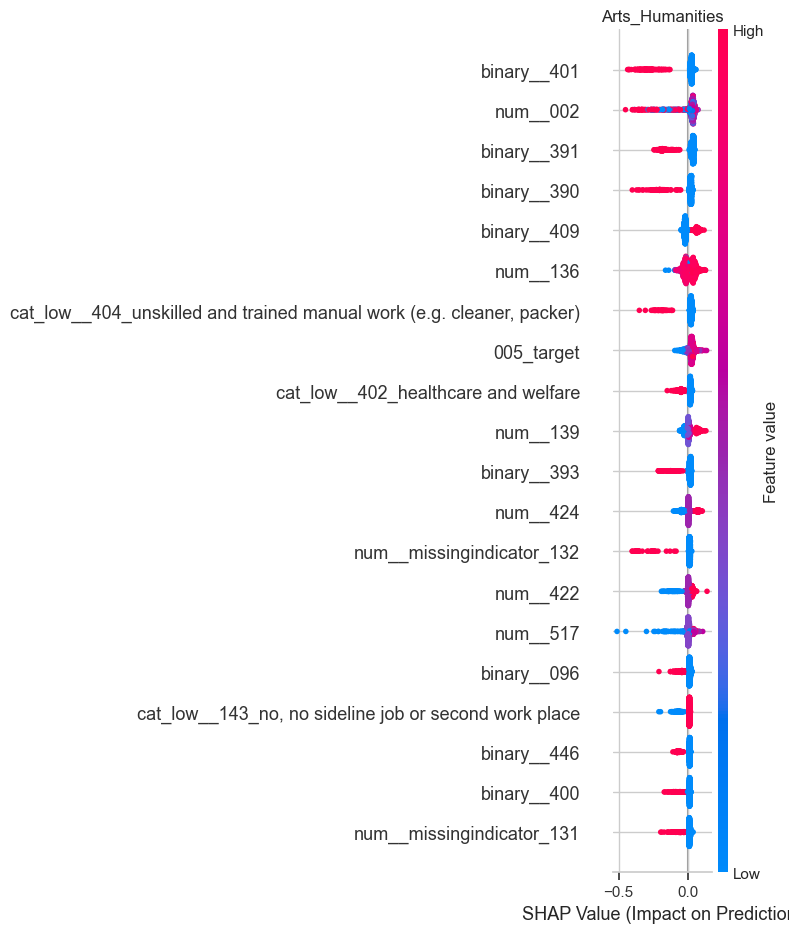


SHAP Analysis for subgroup: Services


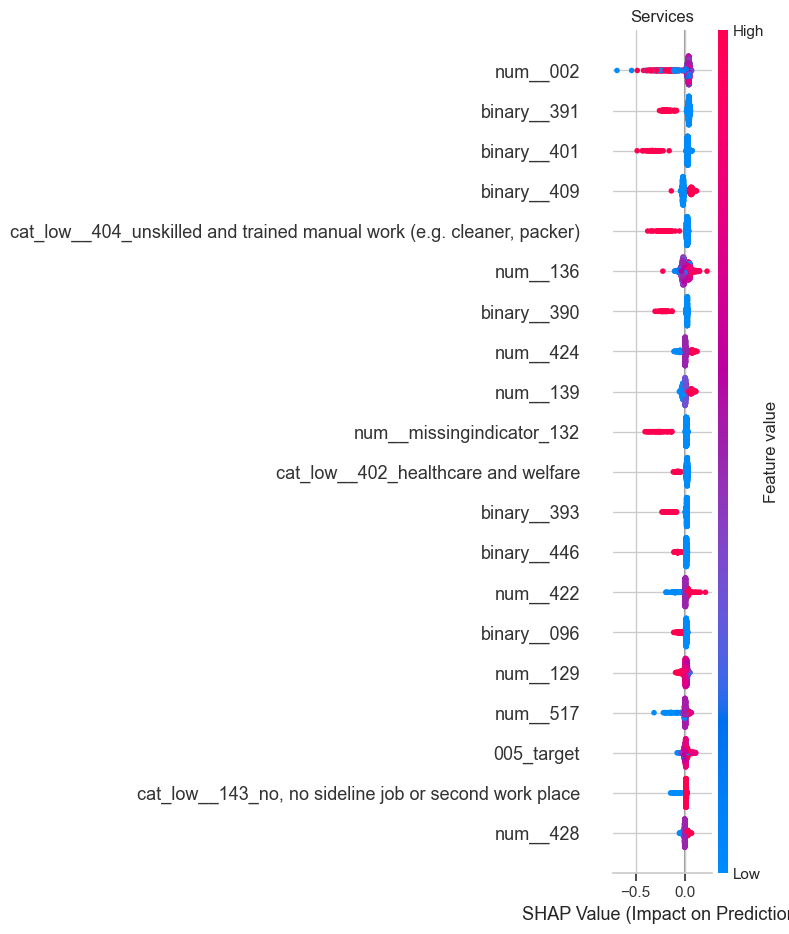


SHAP Analysis for subgroup: Agriculture


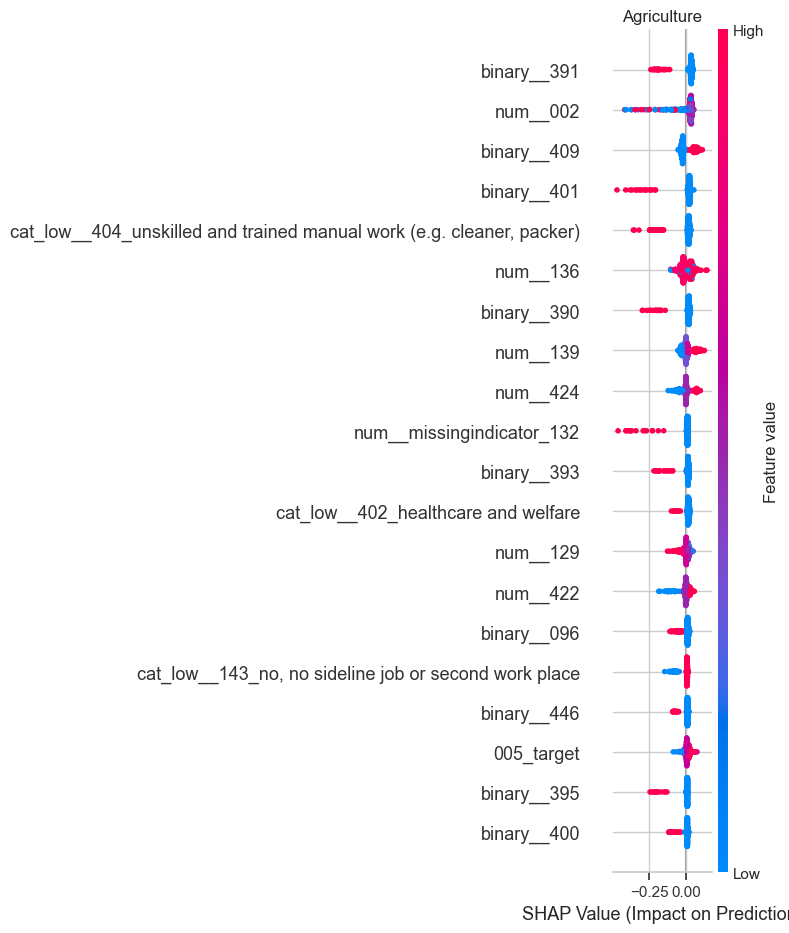


 SHAP SUBGROUP ANALYSIS — Regime B

SHAP Analysis for subgroup: Mid-career


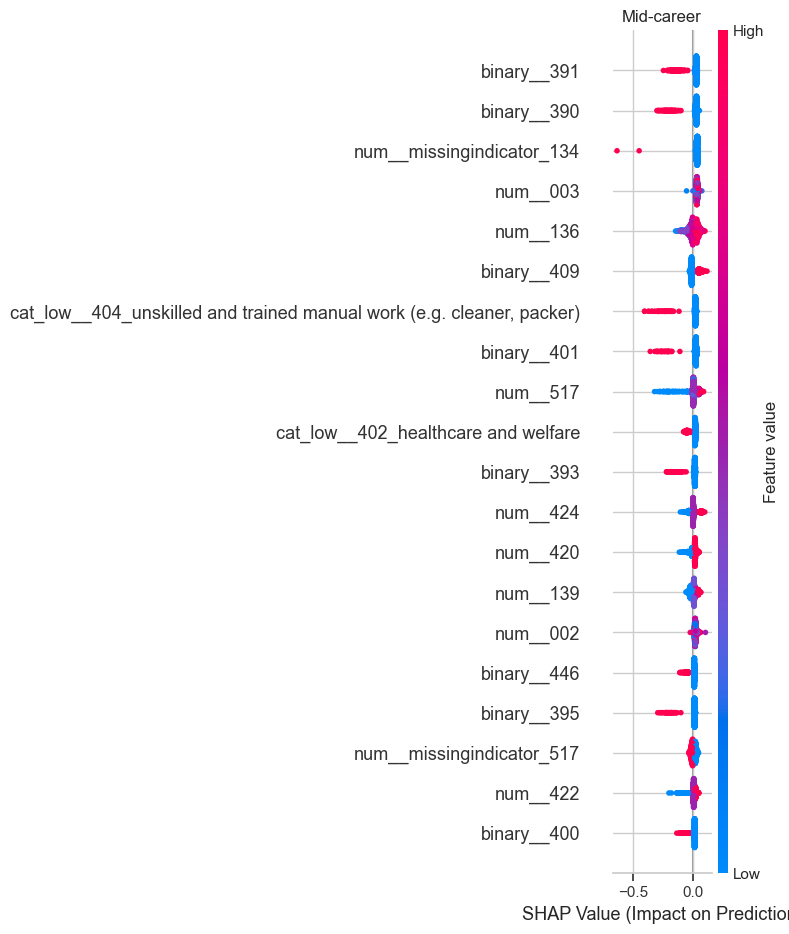


SHAP Analysis for subgroup: Older


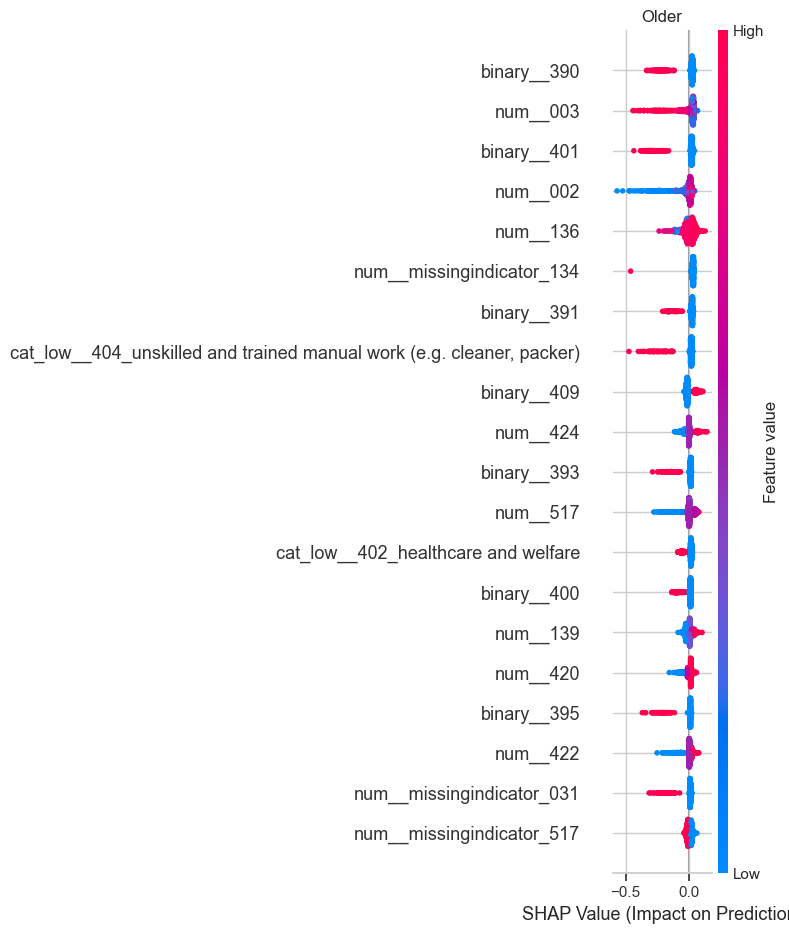


SHAP Analysis for subgroup: Young


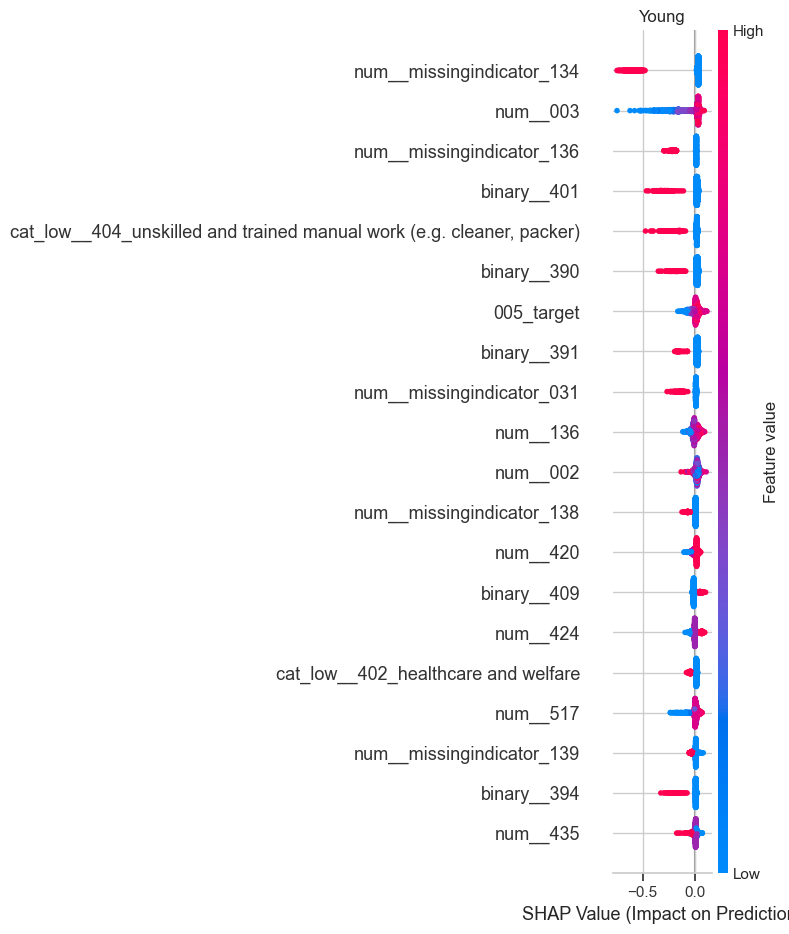


SHAP Analysis for subgroup: Public & Social Services


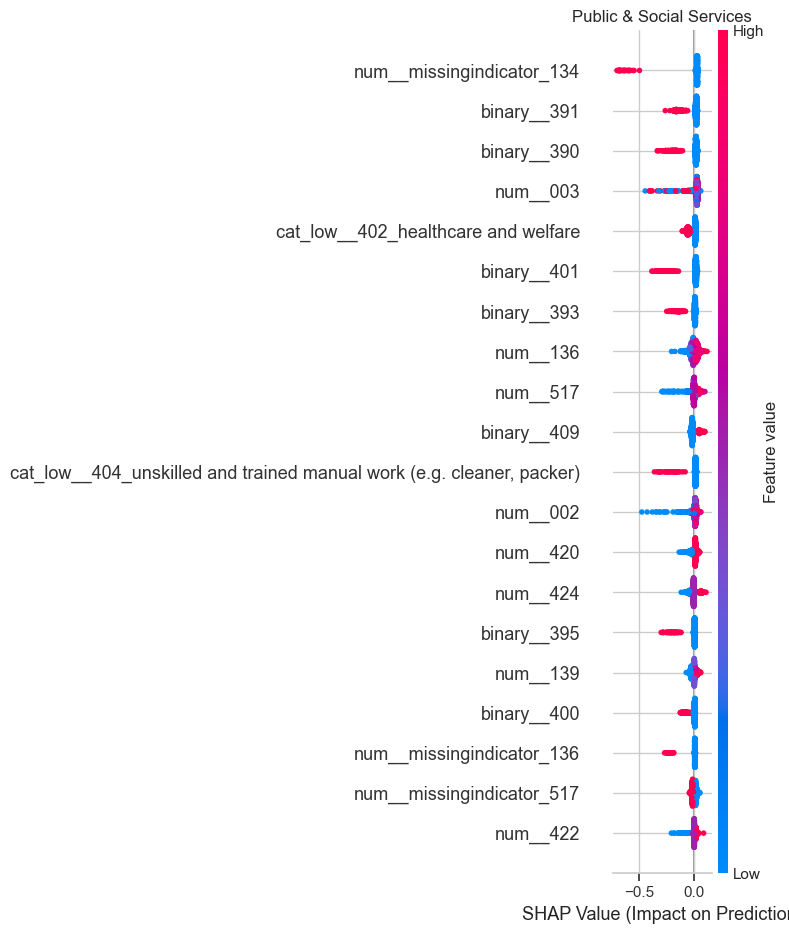


SHAP Analysis for subgroup: Culture & Other Services


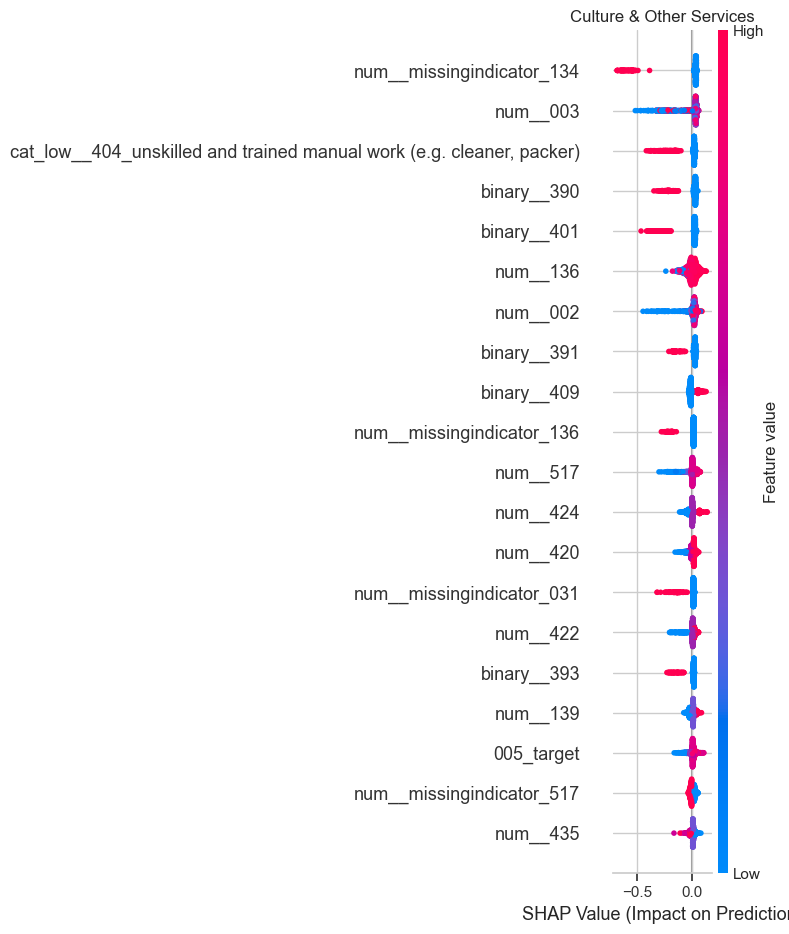


SHAP Analysis for subgroup: Trade & Market Services


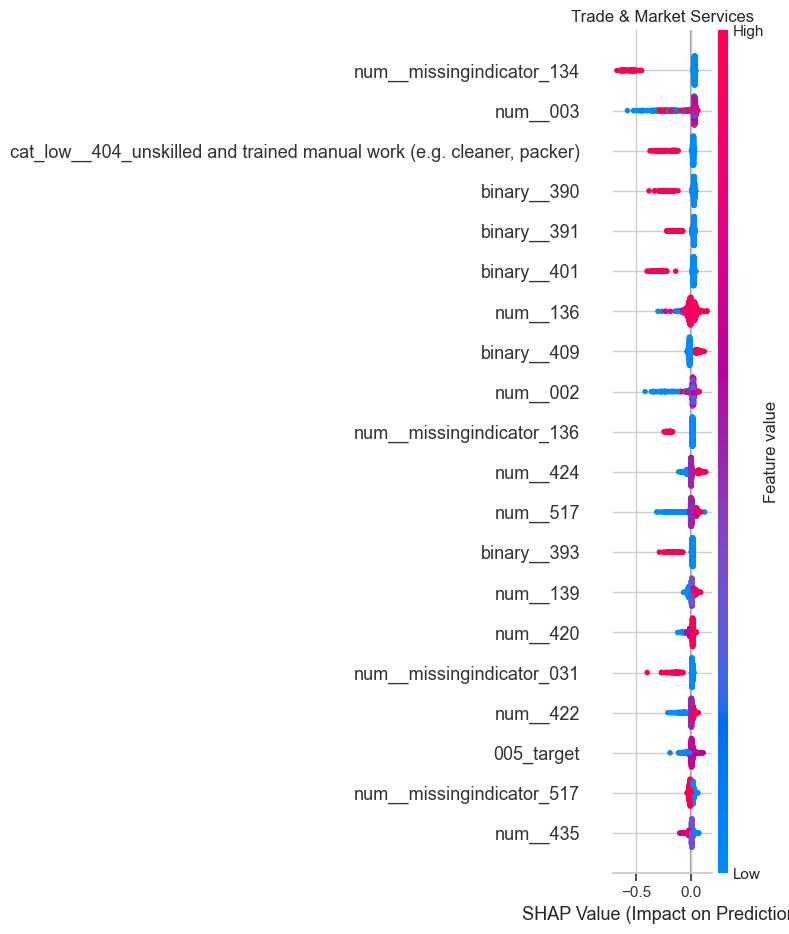


SHAP Analysis for subgroup: Production & Construction


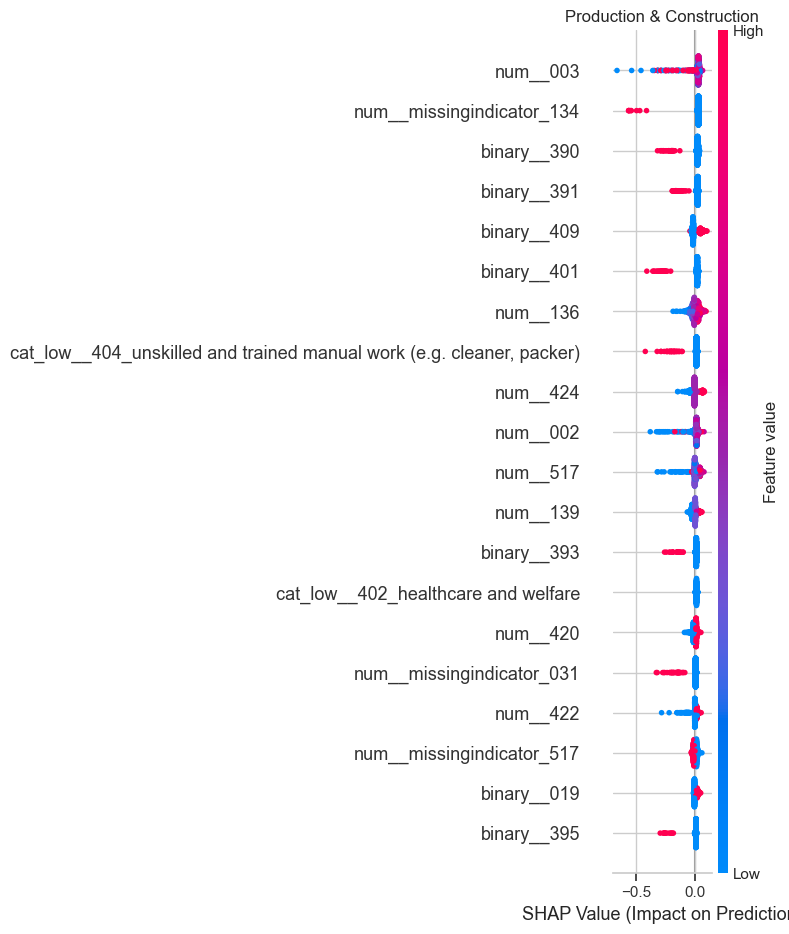


SHAP Analysis for subgroup: Agriculture & Extraction


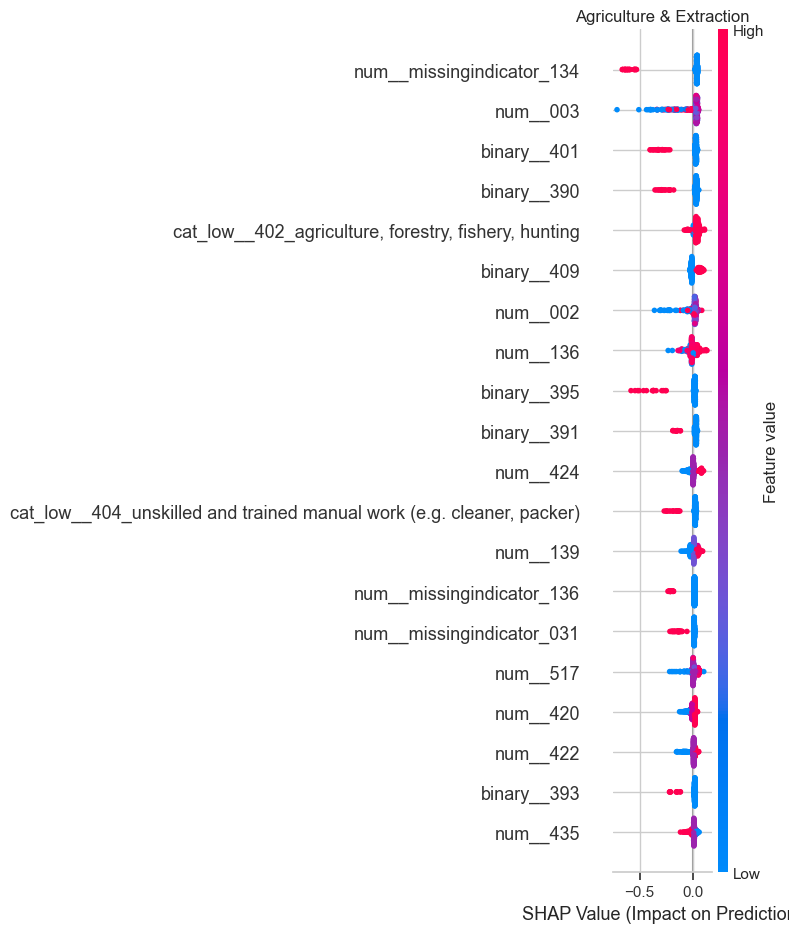


SHAP Analysis for subgroup: Children


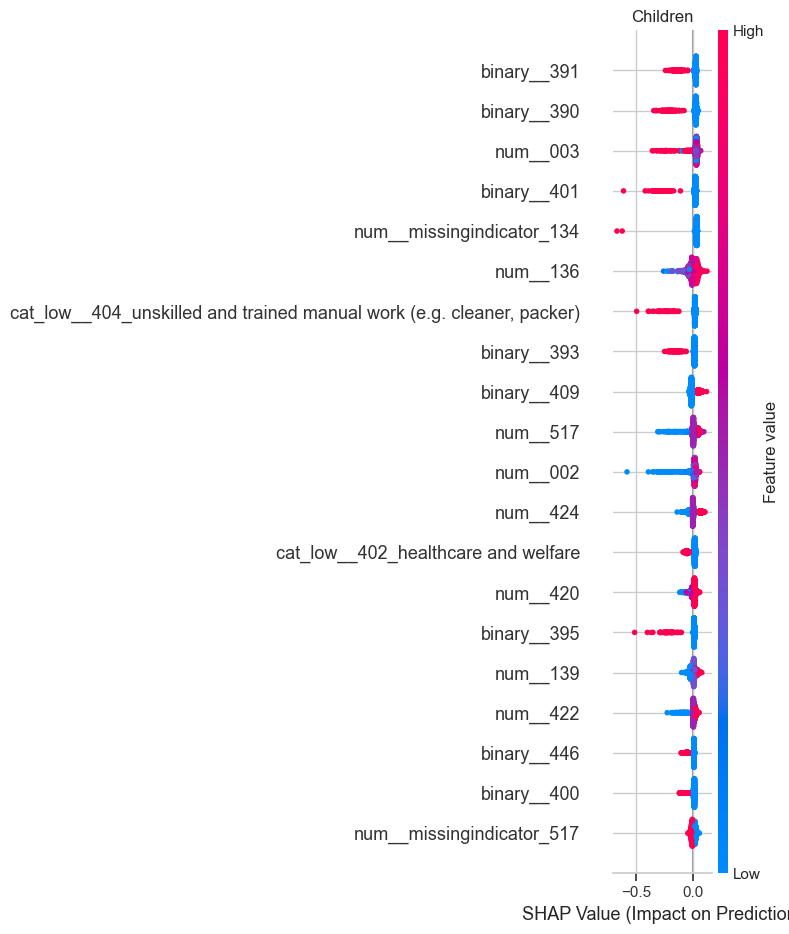


SHAP Analysis for subgroup: Other


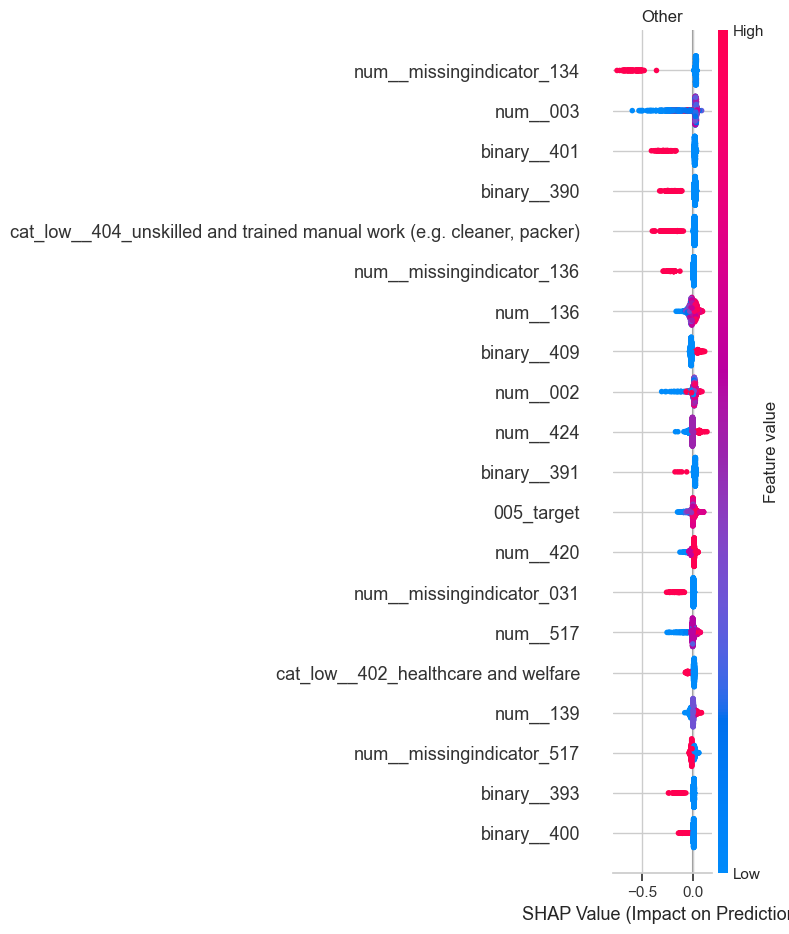


SHAP Analysis for subgroup: Caregiver


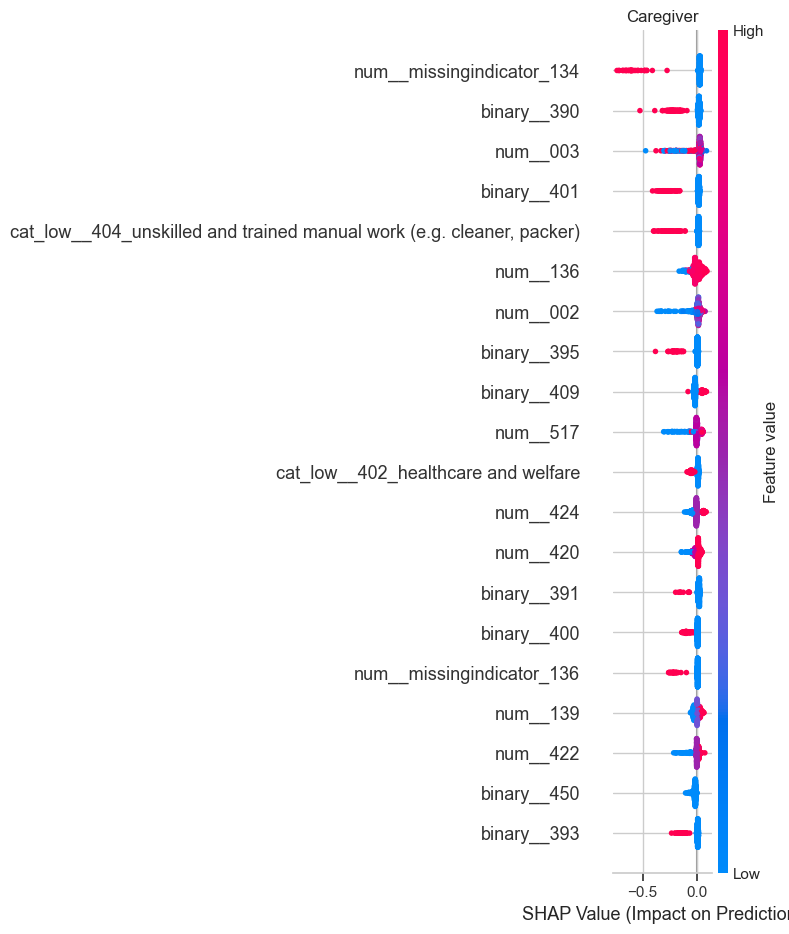


SHAP Analysis for subgroup: Health_Care


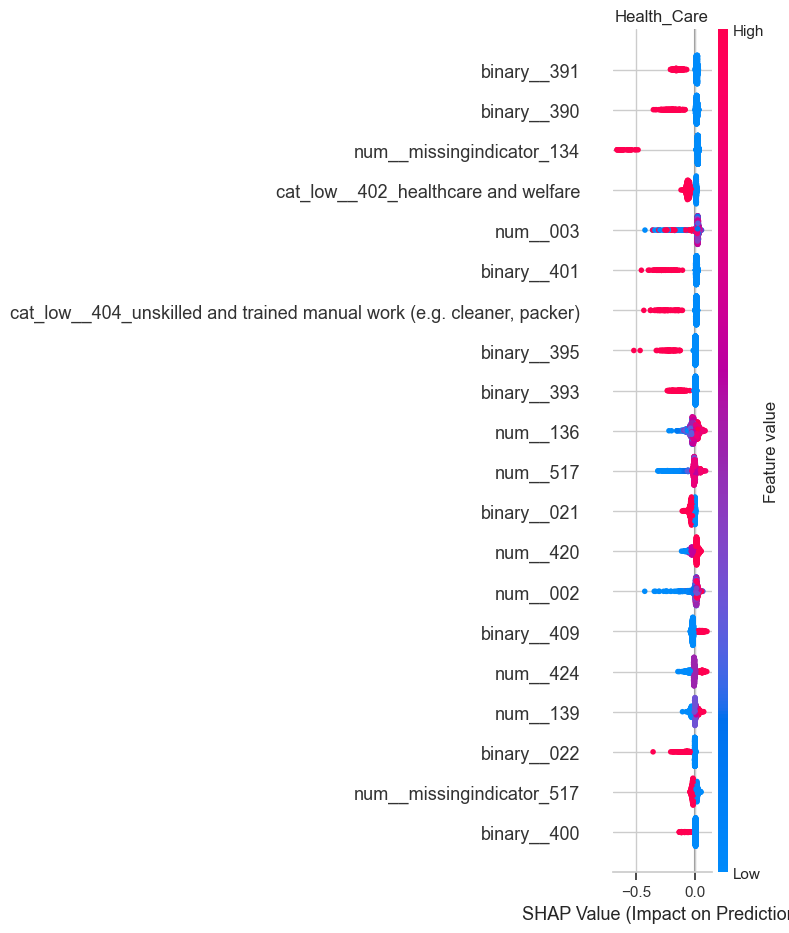


SHAP Analysis for subgroup: Arts_Humanities


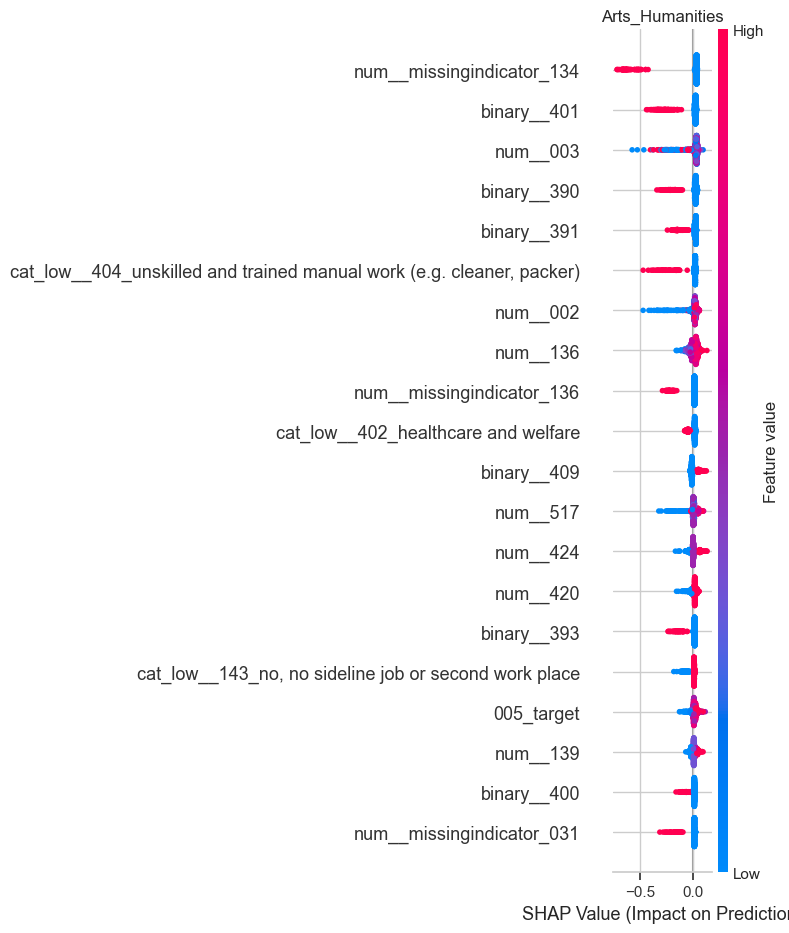


SHAP Analysis for subgroup: Business_Law


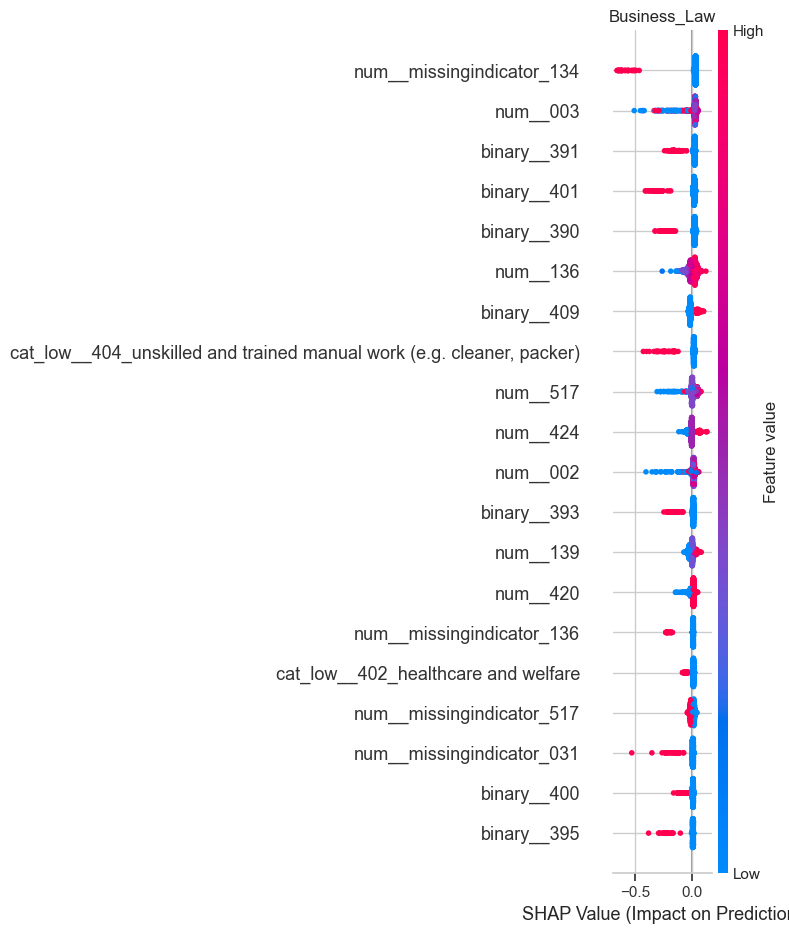


SHAP Analysis for subgroup: Education


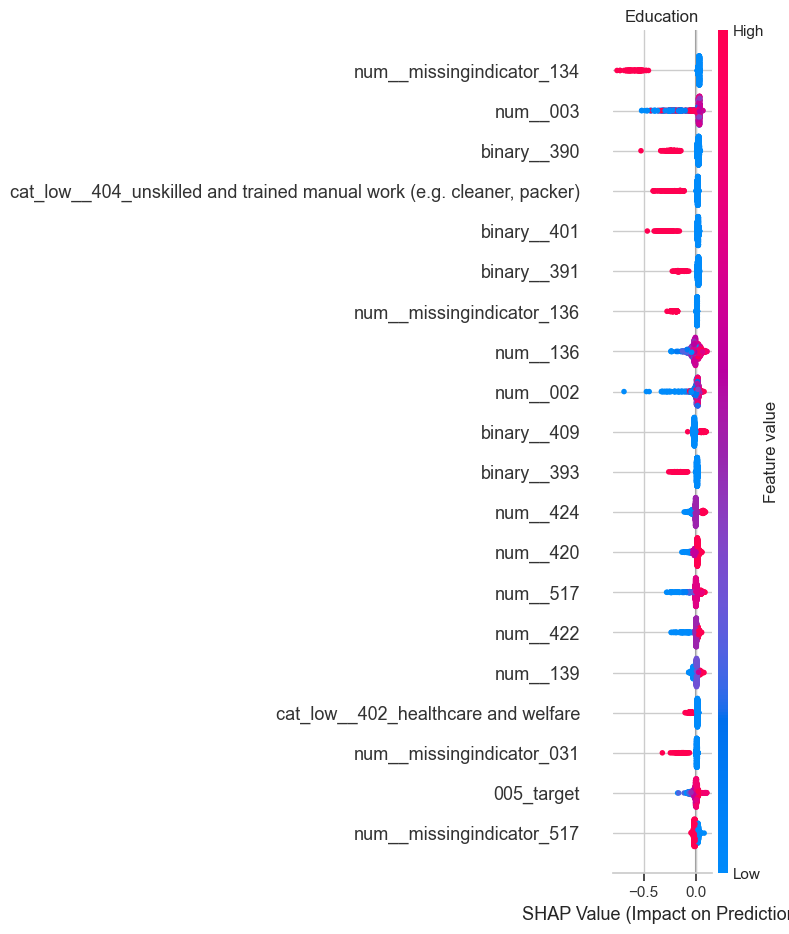


SHAP Analysis for subgroup: STEM


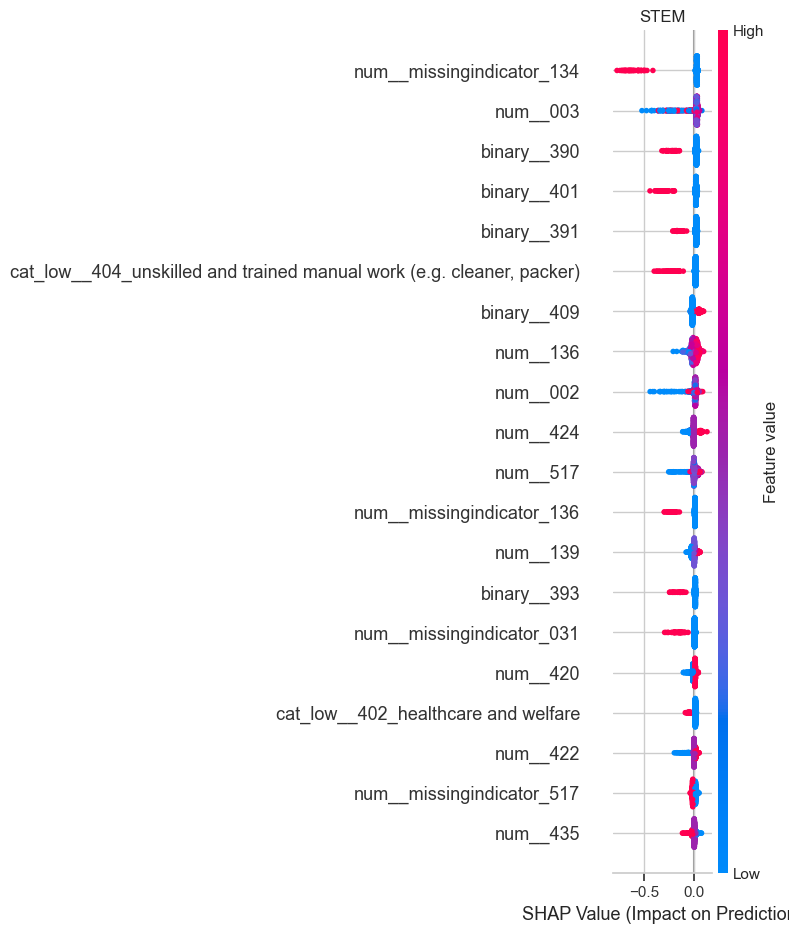


SHAP Analysis for subgroup: Services


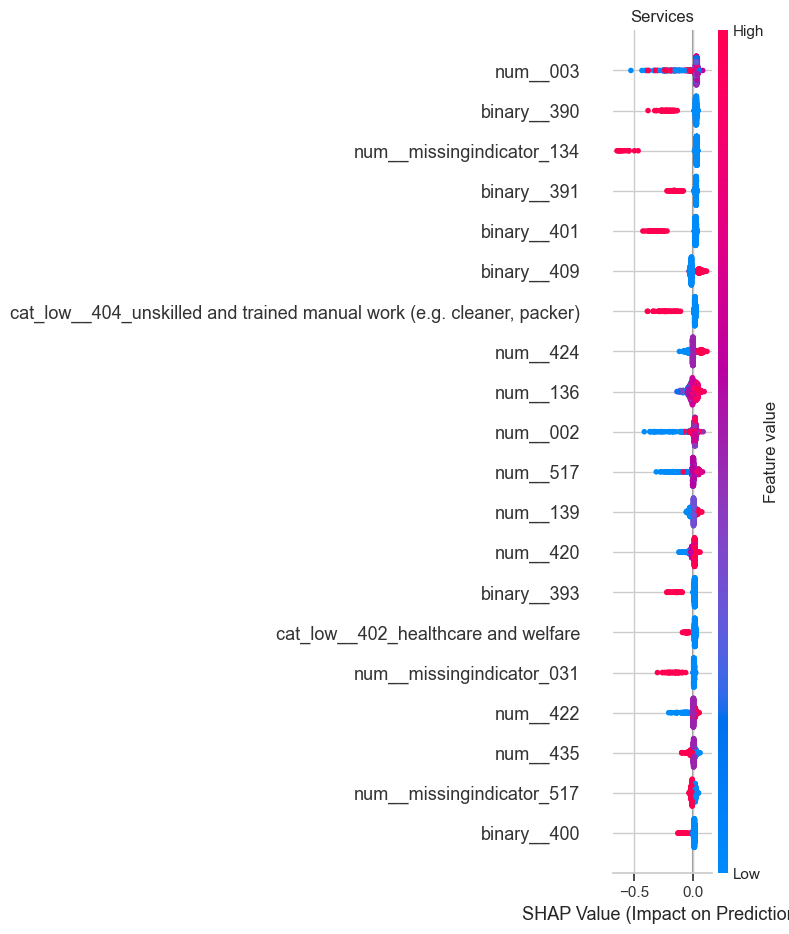


SHAP Analysis for subgroup: Agriculture


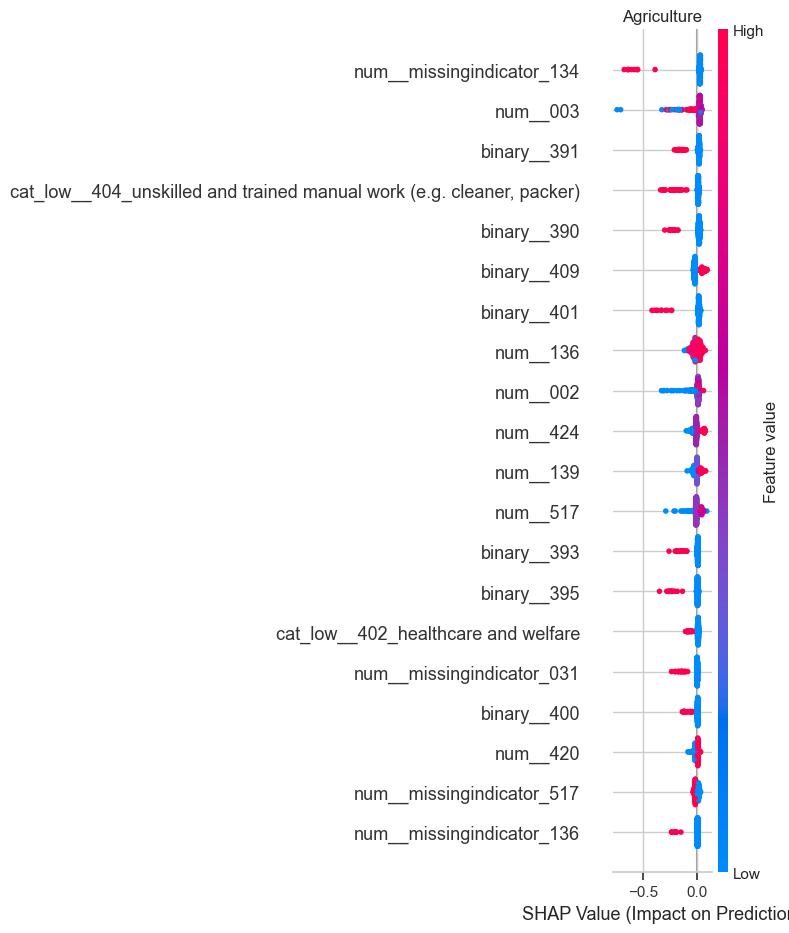


 SHAP SUBGROUP ANALYSIS — Regime C

SHAP Analysis for subgroup: Older


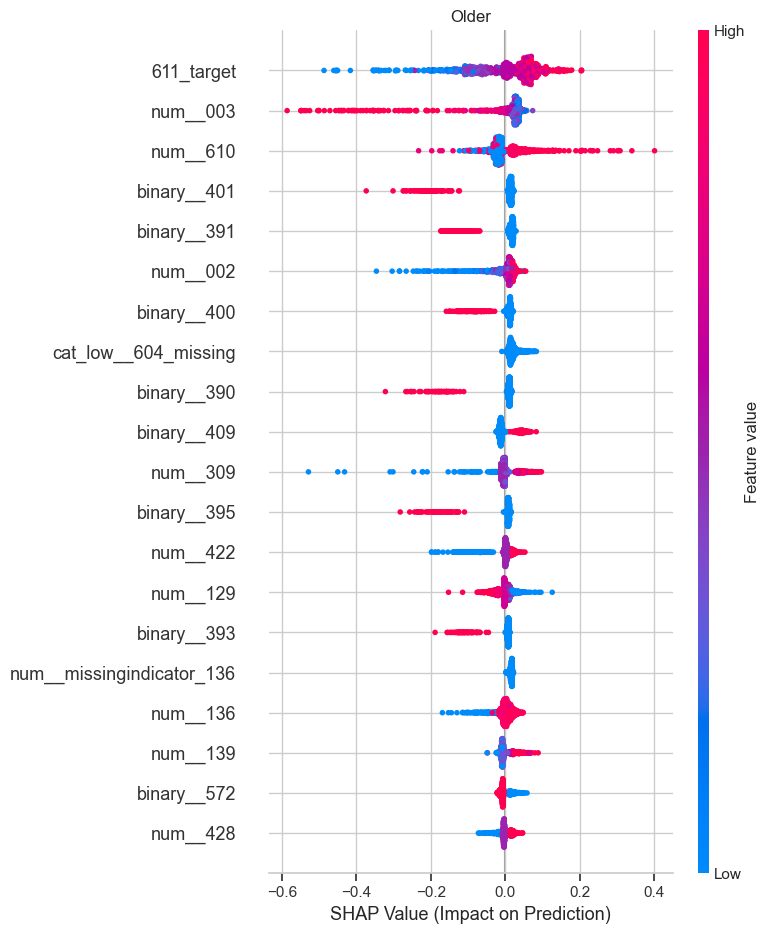


SHAP Analysis for subgroup: Mid-career


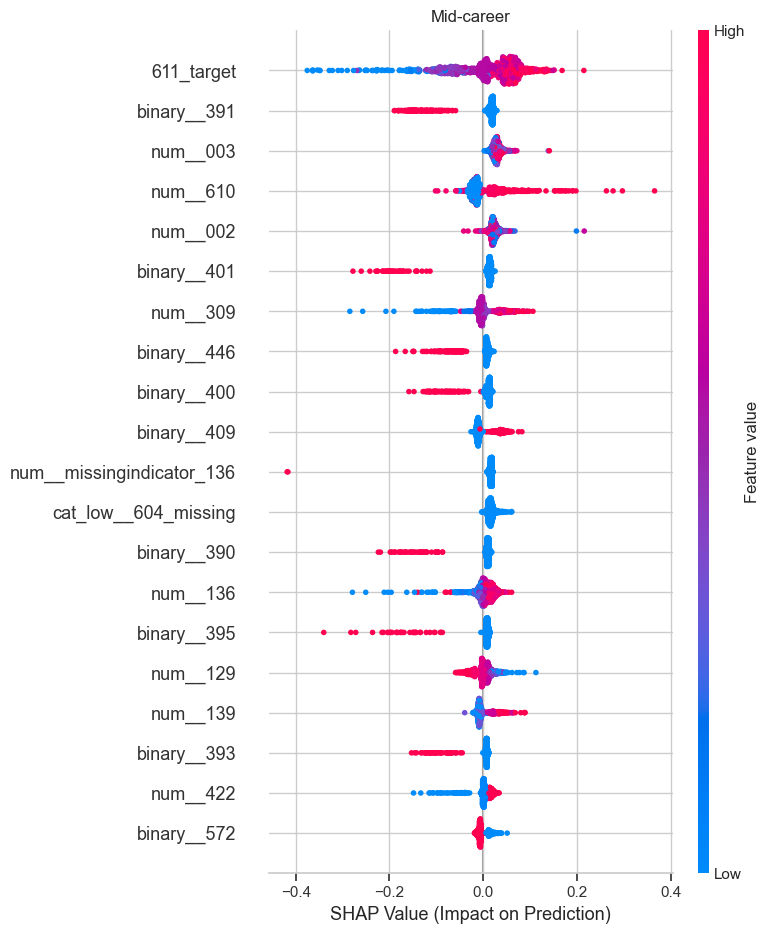


SHAP Analysis for subgroup: Young


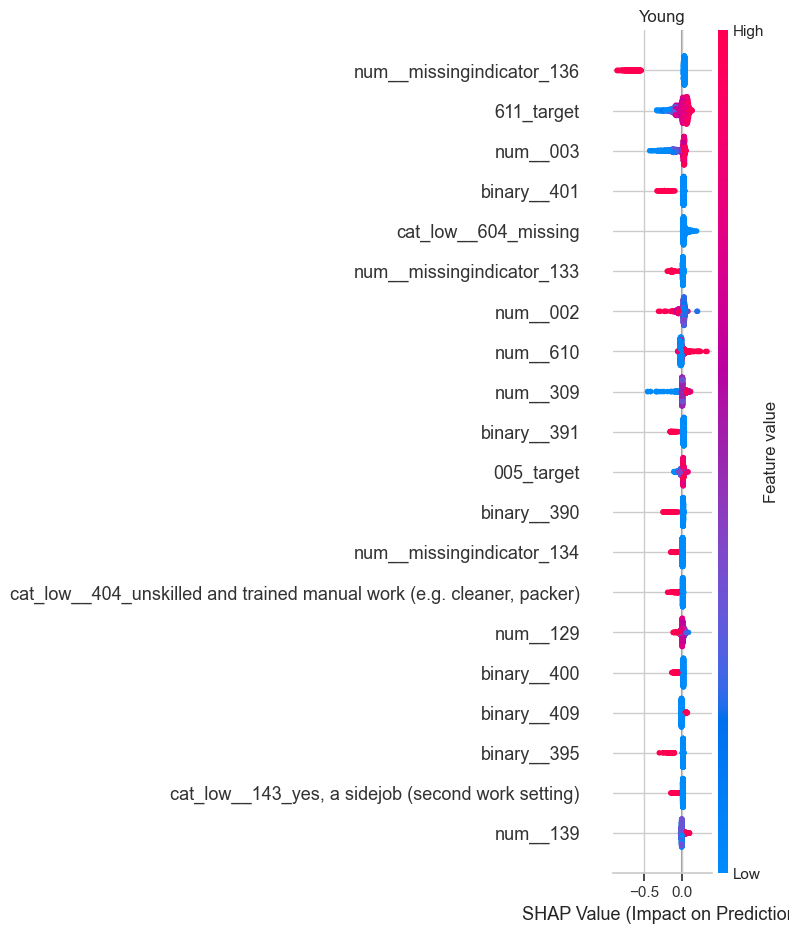


SHAP Analysis for subgroup: Public & Social Services


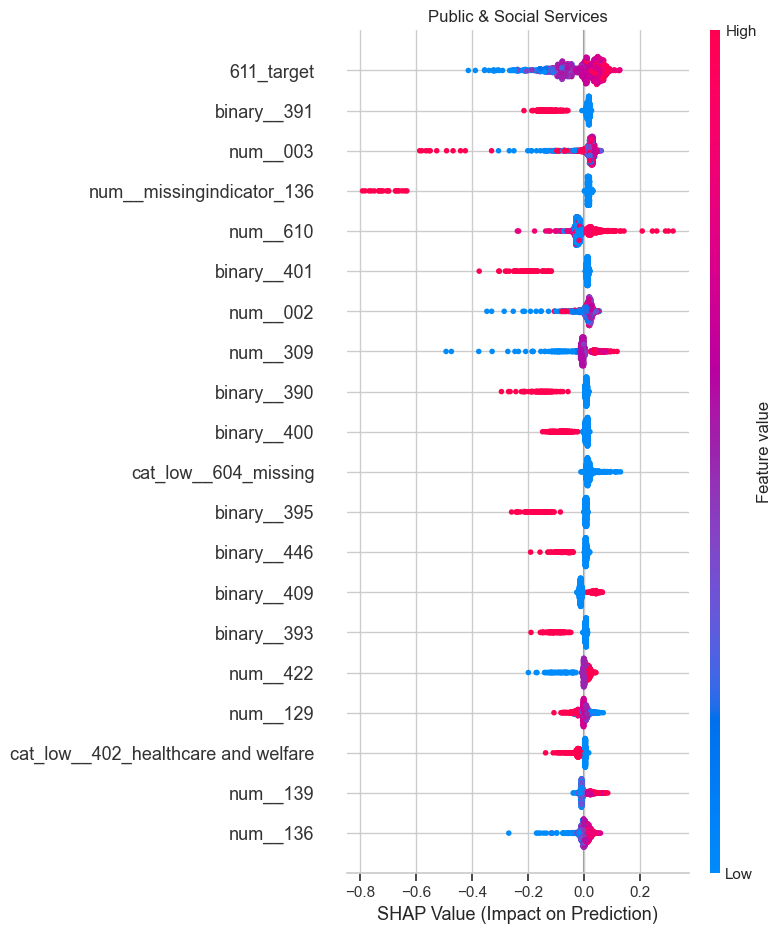


SHAP Analysis for subgroup: Trade & Market Services


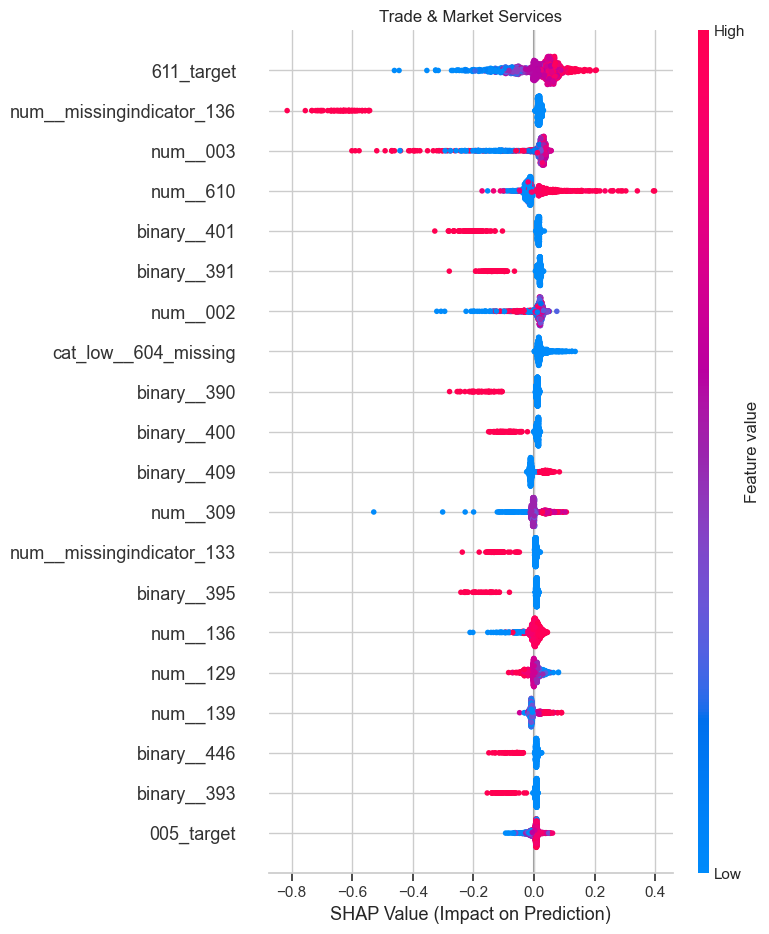


SHAP Analysis for subgroup: Culture & Other Services


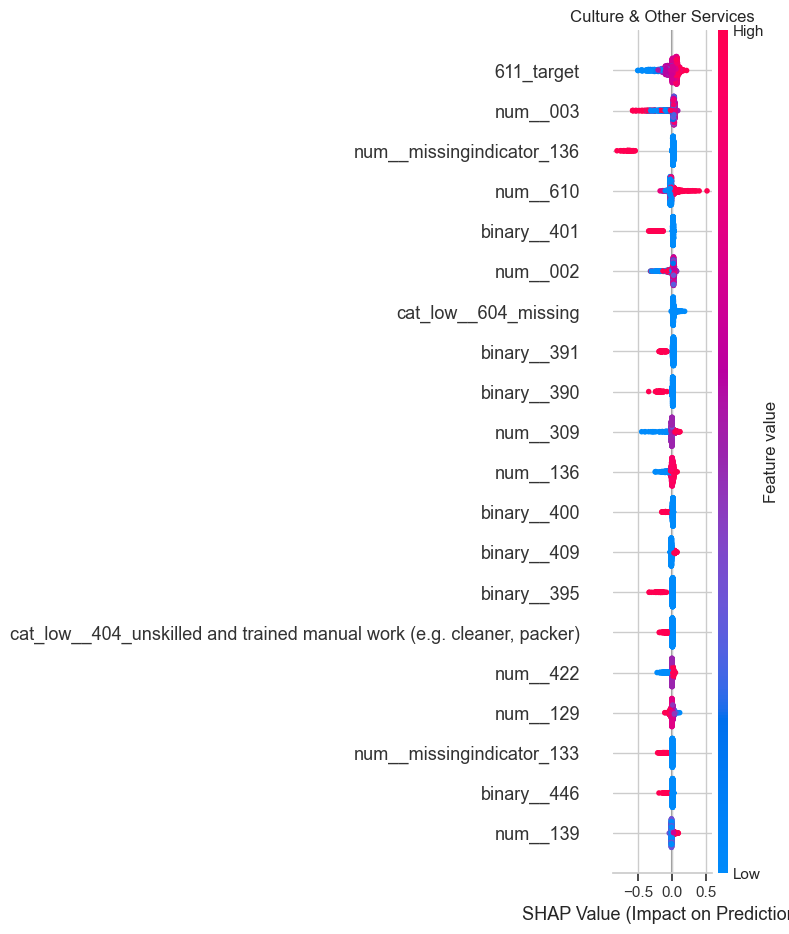


SHAP Analysis for subgroup: Production & Construction


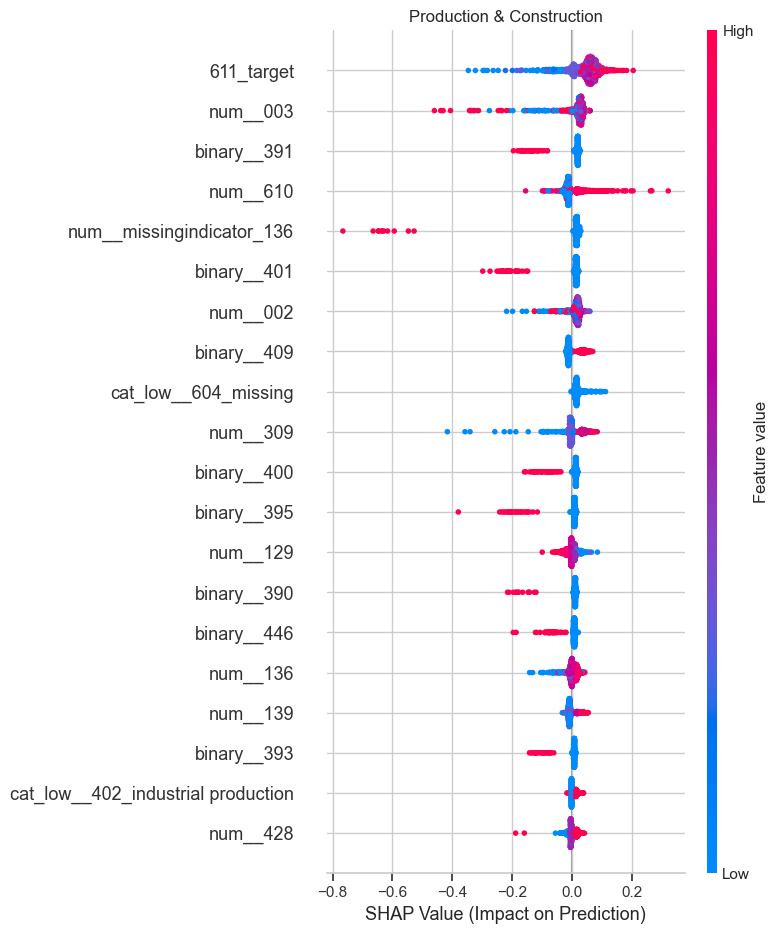


SHAP Analysis for subgroup: Agriculture & Extraction


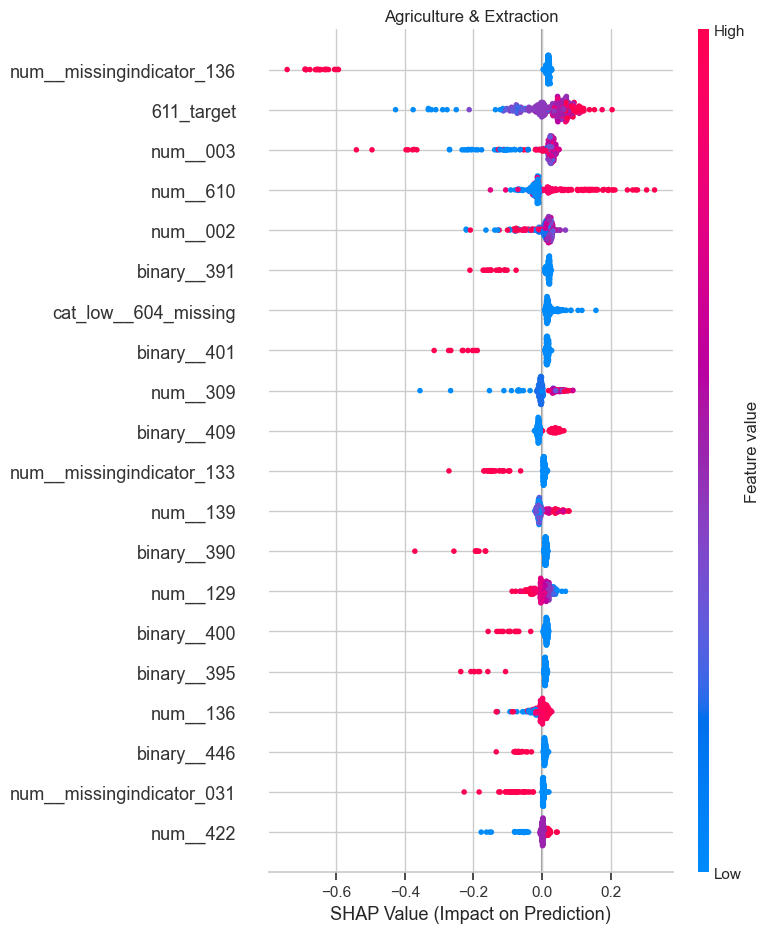


SHAP Analysis for subgroup: Children


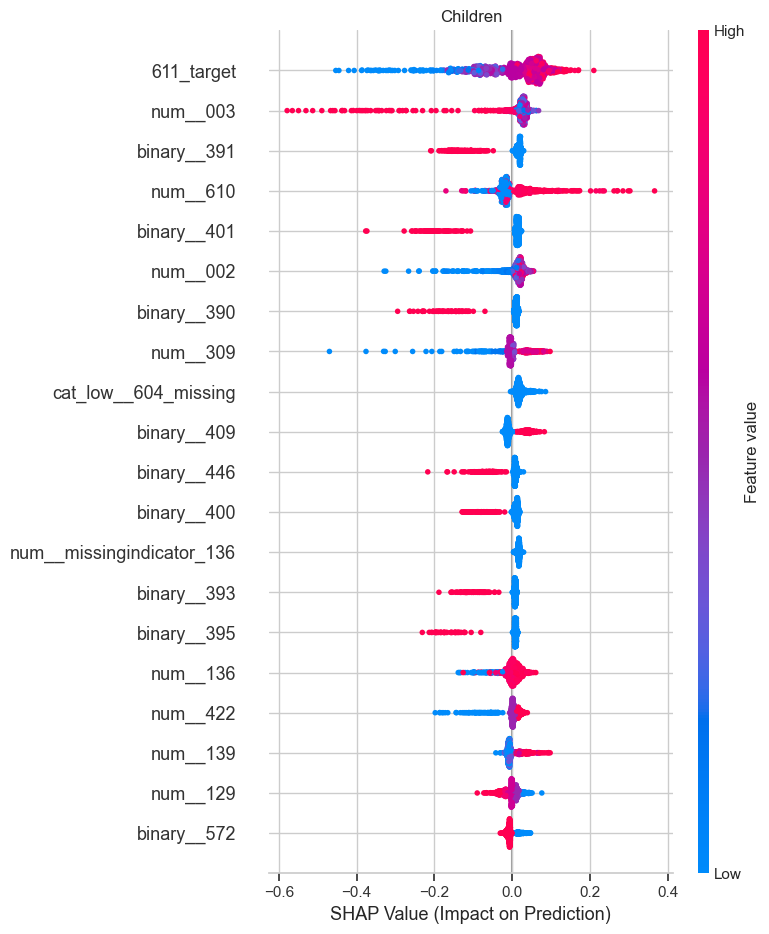


SHAP Analysis for subgroup: Other


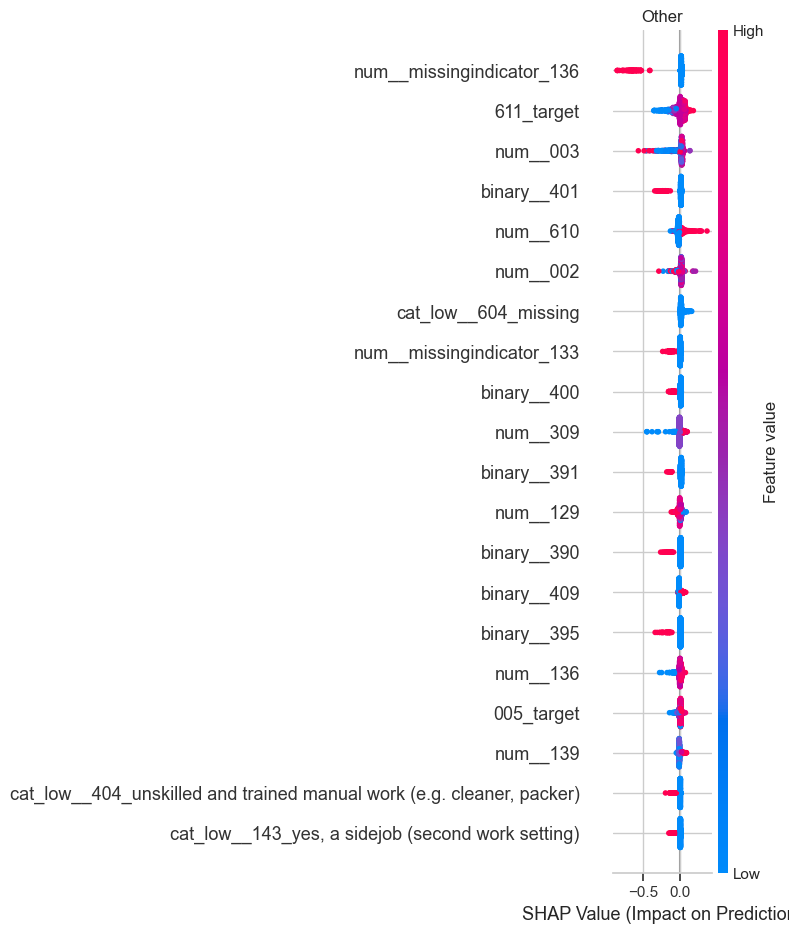


SHAP Analysis for subgroup: Caregiver


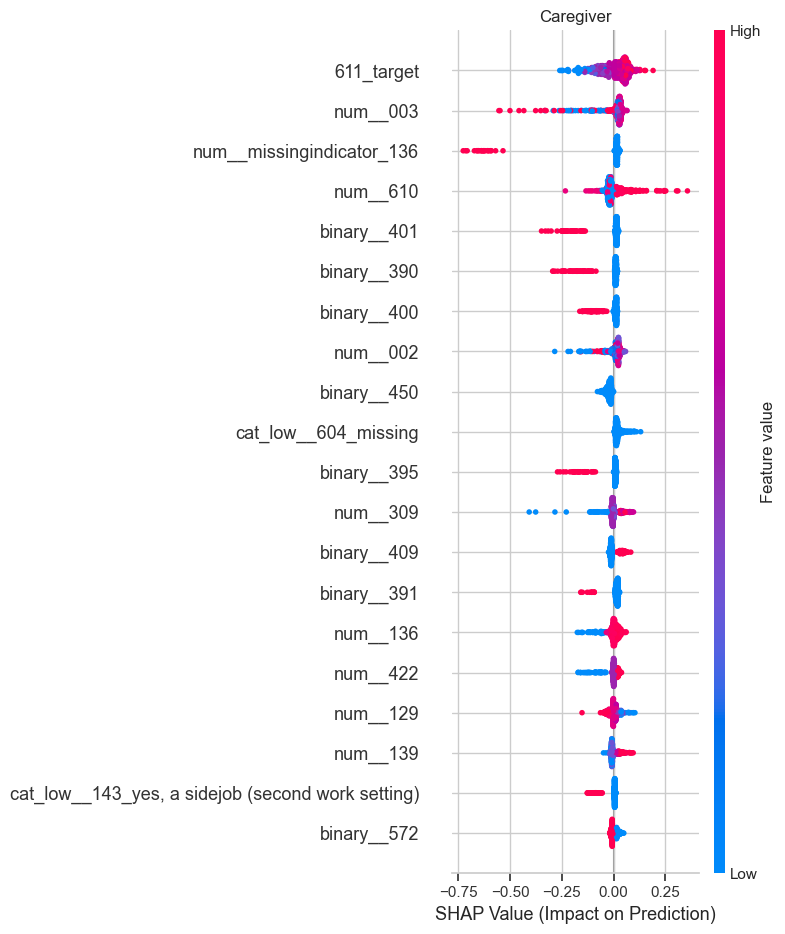


SHAP Analysis for subgroup: Arts_Humanities


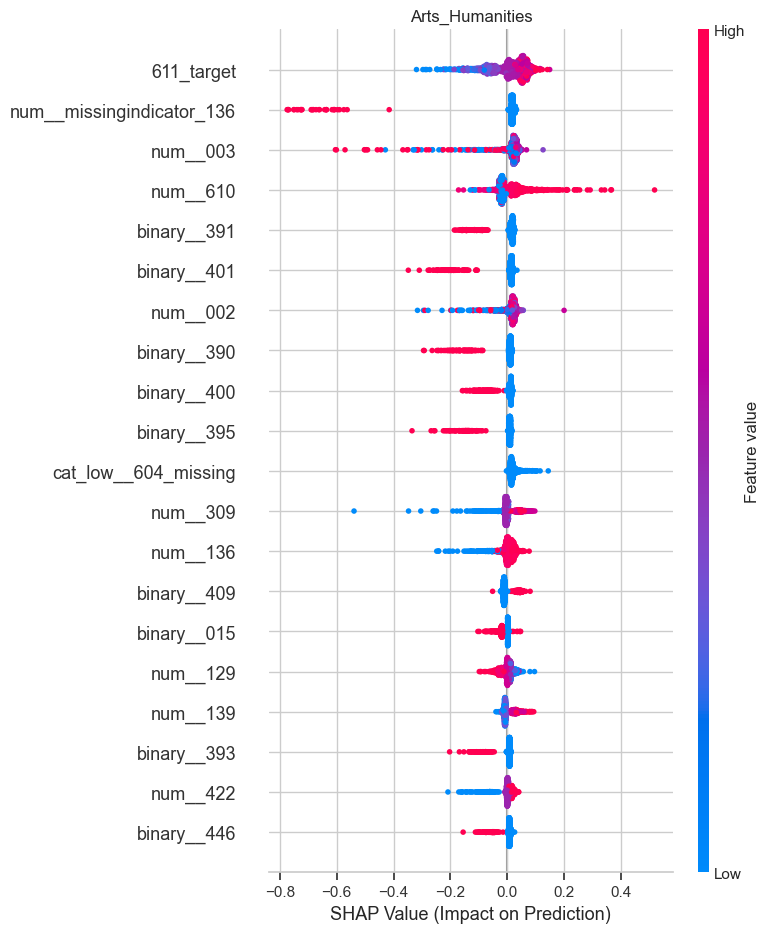


SHAP Analysis for subgroup: Business_Law


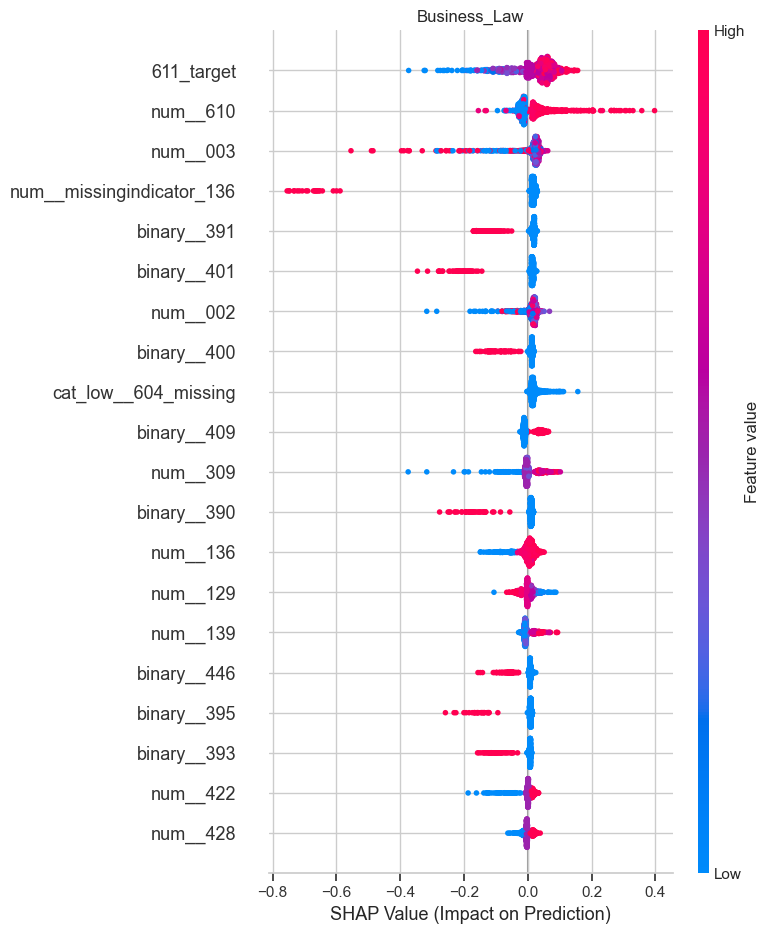


SHAP Analysis for subgroup: Education


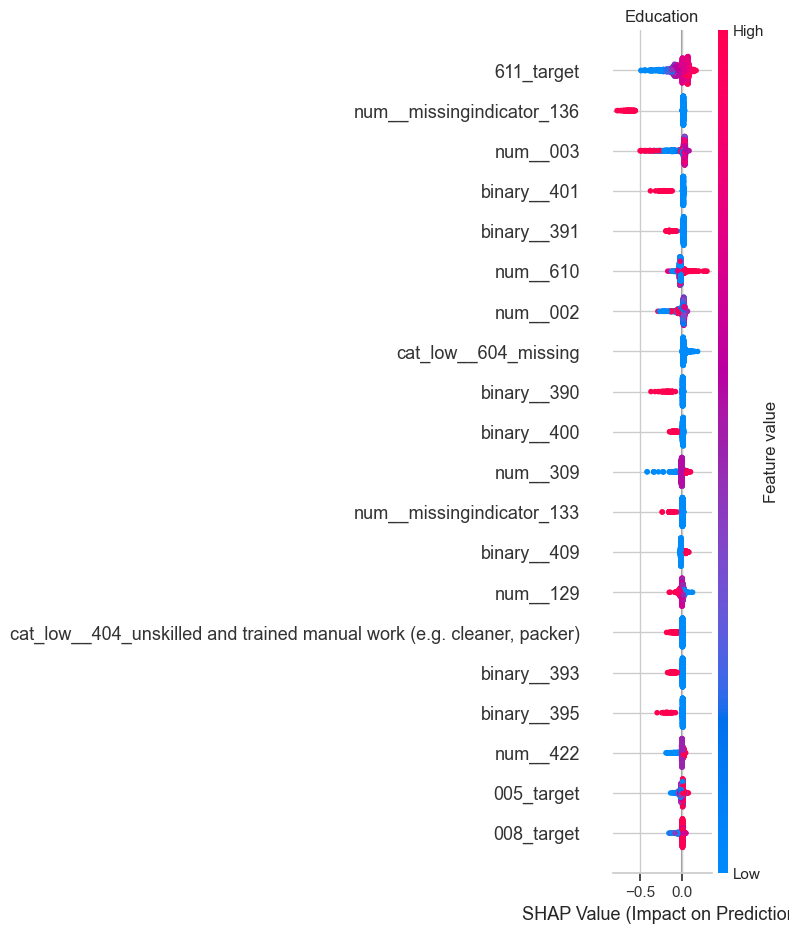


SHAP Analysis for subgroup: Health_Care


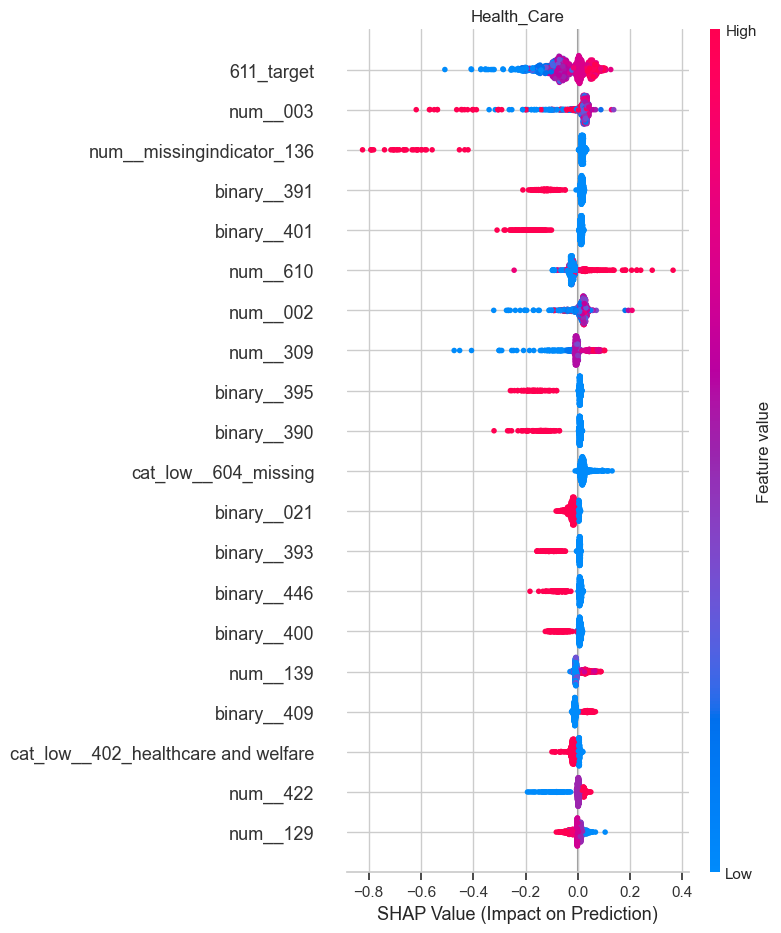


SHAP Analysis for subgroup: STEM


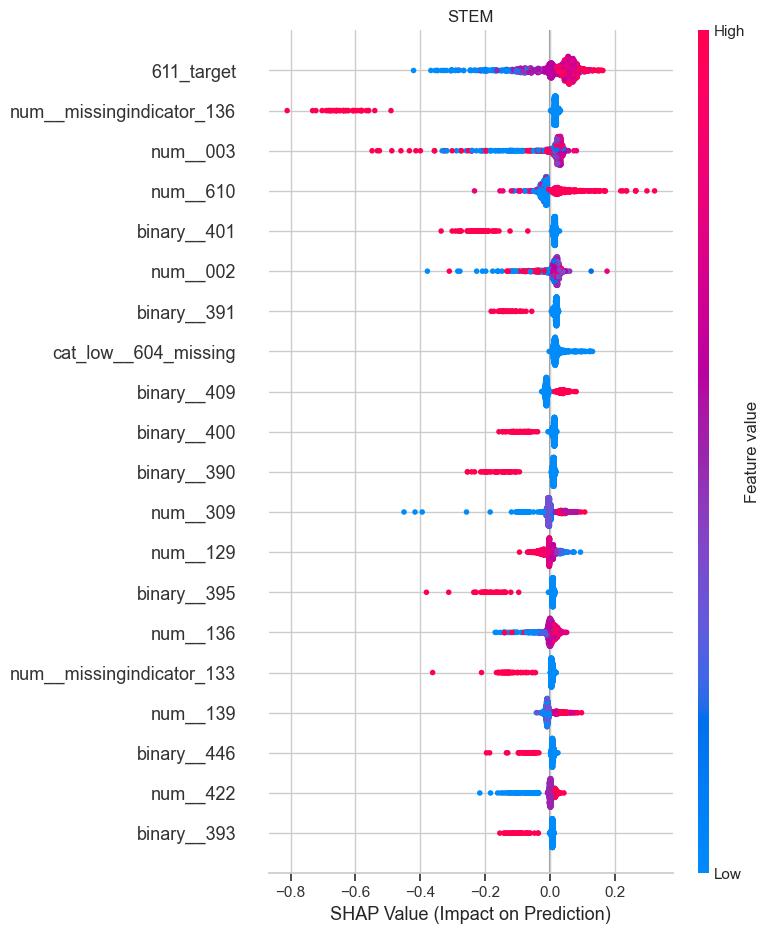


SHAP Analysis for subgroup: Agriculture


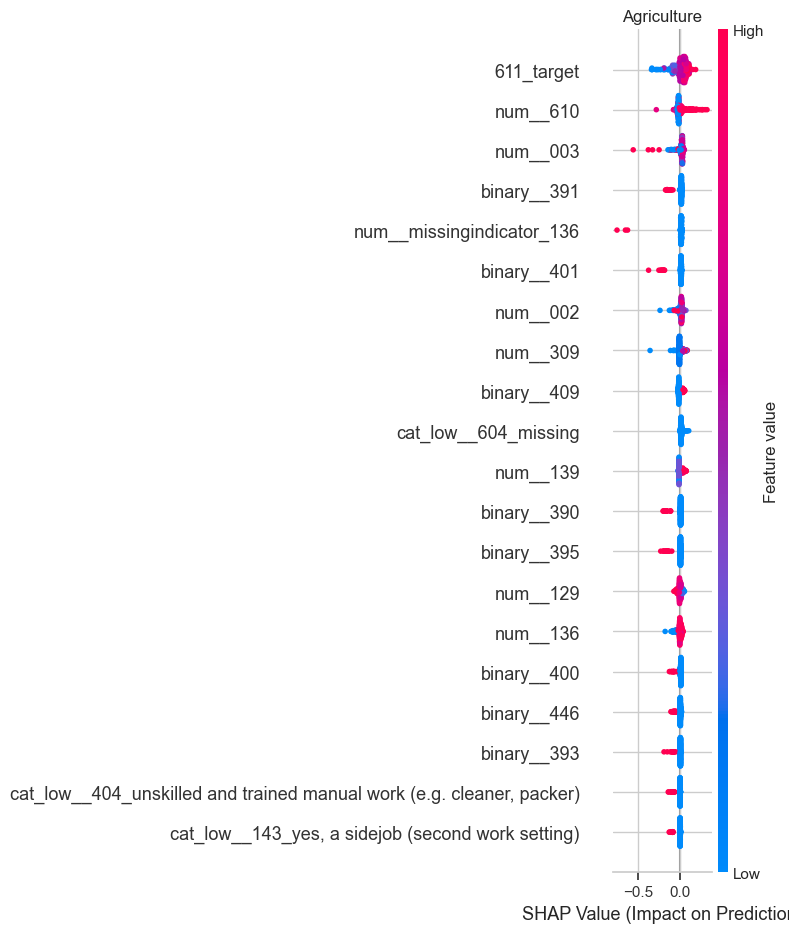


SHAP Analysis for subgroup: Services


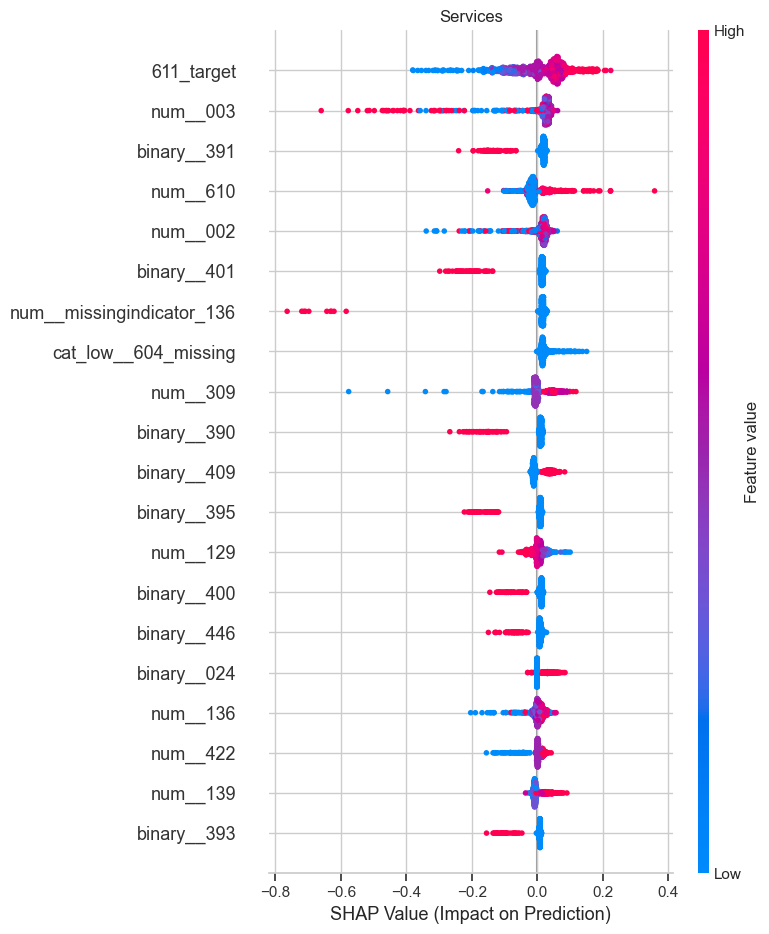

In [255]:
shap_results_a = run_shap_subgroups_for_regime(
    "Regime A",
    df_regime_a,
    ALL_RESULTS["Regime A"]["results"]["XGBoost"]
)

shap_results_b = run_shap_subgroups_for_regime(
    "Regime B",
    df_regime_b,
    ALL_RESULTS["Regime B"]["results"]["XGBoost"]
)

shap_results_c = run_shap_subgroups_for_regime(
    "Regime C",
    df_regime_c,
    ALL_RESULTS["Regime C"]["results"]["XGBoost"]
)


### Subgroup SHAP Comparisons

#### Within-Regime Subgroup Comparisons

In [262]:
compare_subgroups_within_regime(shap_results_a["age_group"])
compare_subgroups_within_regime(shap_results_b["sector_group"])
compare_subgroups_within_regime(shap_results_c["life_situation"])


,Subgroup Pair,Spearman rho,p-value
0,Children vs Other,0.632353,0.008578
1,Children vs Caregiver,0.766770,0.000205
2,Other vs Caregiver,0.877451,0.000004


#### Across-regime subgroup comparison

In [274]:
spearman_outputs = compute_all_subgroup_spearman(
    shap_results_a,
    shap_results_b,
    shap_results_c
)

spearman_outputs


{'age_group': {'across_regimes':      Subgroup Regime Pair  Spearman rho   p-value
  0  Mid-career      A vs B      0.447287  0.024971
  1  Mid-career      A vs C     -0.067507  0.732865
  2  Mid-career      B vs C     -0.128571  0.522741
  3       Young      A vs B      0.152941  0.437171
  4       Young      A vs C     -0.102079  0.591437
  5       Young      B vs C      0.116859  0.538568
  6       Older      A vs B      0.633333  0.000678
  7       Older      A vs C      0.060208  0.770160
  8       Older      B vs C      0.081232  0.681128,
  'within_regime_A':          Subgroup Pair  Spearman rho   p-value
  0  Young vs Mid-career      0.427950  0.025958
  1       Young vs Older      0.497516  0.008279
  2  Mid-career vs Older      0.739604  0.000055,
  'within_regime_B':          Subgroup Pair  Spearman rho   p-value
  0  Mid-career vs Older      0.800000  0.000013
  1  Mid-career vs Young      0.396894  0.040384
  2       Older vs Young      0.439792  0.024564,
  'within_regime

In [276]:
table_all_subgroups = table_all_subgroups_across_regimes(
    shap_results_a,
    shap_results_b,
    shap_results_c
)

table_all_subgroups


,Subgroup Category,Subgroup,Regime Pair,Spearman rho,p-value
0,age_group,Mid-career,A vs B,0.447287,0.024971
1,age_group,Mid-career,A vs C,-0.067507,0.732865
2,age_group,Mid-career,B vs C,-0.128571,0.522741
3,age_group,Young,A vs B,0.152941,0.437171
4,age_group,Young,A vs C,-0.102079,0.591437
5,age_group,Young,B vs C,0.116859,0.538568
6,age_group,Older,A vs B,0.633333,0.000678
7,age_group,Older,A vs C,0.060208,0.770160
8,age_group,Older,B vs C,0.081232,0.681128
9,sector_group,Public & Social Services,A vs B,0.411628,0.040912


# Packages, Jupyter, & Conda Versions

In [242]:
import sys
import numpy as np
import pandas as pd
import matplotlib
import seaborn as sns
import sklearn
import xgboost
import shap
import category_encoders

print("Python:", sys.version)
print("NumPy:", np.__version__)
print("Pandas:", pd.__version__)
print("Matplotlib:", matplotlib.__version__)
print("Seaborn:", sns.__version__)
print("Scikit-learn:", sklearn.__version__)
print("XGBoost:", xgboost.__version__)
print("SHAP:", shap.__version__)
print("Category Encoders:", category_encoders.__version__)


Python: 3.12.7 | packaged by Anaconda, Inc. | (main, Oct  4 2024, 13:17:27) [MSC v.1929 64 bit (AMD64)]
NumPy: 1.26.4
Pandas: 2.2.2
Matplotlib: 3.9.2
Seaborn: 0.13.2
Scikit-learn: 1.7.2
XGBoost: 3.1.2
SHAP: 0.50.0
Category Encoders: 2.8.1


In [244]:
!jupyter --version


Selected Jupyter core packages...
IPython          : 8.27.0
ipykernel        : 6.29.5
ipywidgets       : 7.8.1
jupyter_client   : 7.4.9
jupyter_core     : 5.7.2
jupyter_server   : 2.14.1
jupyterlab       : 4.2.5
nbclient         : 0.8.0
nbconvert        : 7.16.4
nbformat         : 5.10.4
notebook         : 6.5.7
qtconsole        : 5.7.0
traitlets        : 5.14.3


In [246]:
!conda --version

conda 24.11.3
